In [52]:
# Imports

from graspologic.embed import OmnibusEmbed as BONDI
import scipy
from graspologic.plot import pairplot
from graspologic.embed import select_svd
from graspologic.embed.omni import _get_omni_matrix
import numpy as np
from nilearn import plotting
from matplotlib.pyplot import cm
from graspologic.embed import AdjacencySpectralEmbed as ASE 
import matplotlib.pyplot as plt
from scipy.sparse.csgraph import laplacian
from scipy.linalg import eigh
import random
from graspologic.embed import LaplacianSpectralEmbed as LSE
from graspologic.embed import MultipleASE as MASE
import spectral_embedding_methods as sem
import os
import nilearn

SC_or_FC = 'FC_ours'

if SC_or_FC=='SC':
    MATRIX_FILE = '/home/personal/Documents/2023_2/tesis/GNN-BAA/data_processing/data/original_data/scs_desikan.mat'
    mat = scipy.io.loadmat(MATRIX_FILE)
    matrix = mat.get('scs')
    subject_list = mat.get('subject_list')
    
elif SC_or_FC=='FC':
    MATRIX_FILE = '/home/personal/Documents/2023_2/tesis/GNN-BAA/data_processing/data/original_data/correlations_desikan_old.mat'
    mat = scipy.io.loadmat(MATRIX_FILE)
    matrix = mat.get('fcs').astype('float32')
    matrix = np.where(matrix < 0, 0, matrix)
    subject_list = mat.get('subject_list')
    
elif SC_or_FC=='FC_ours':
    fc_list_processed = []
    # MATRIX_PATH = '/home/personal/Documents/2023_2/tesis/data_processing/data_destrieux/corr_matrices/'
    MATRIX_PATH = '/home/personal/Documents/2023_2/tesis/GNN-BAA/data_processing/data/87_nodes_downloaded_on_imerl/corr_matrices/'
    for person in os.listdir(MATRIX_PATH):
        person_path = os.path.join(MATRIX_PATH, person)
        for fc in os.listdir(person_path):
            if ('corr' in fc):
                fc = np.load(os.path.join(person_path, fc))
                fc = np.where(fc < 0, 0, fc)
                fc_list_processed.append(fc)
    matrix = np.array(fc_list_processed).T
        

In [53]:
matrix.shape

(87, 87, 1080)

In [30]:
dataset = nilearn.datasets.fetch_atlas_destrieux_2009(lateralized=True, data_dir=None, url=None, resume=True, verbose=1, legacy_format=True)

/home/personal/anaconda3/envs/NG/lib/python3.9/site-packages/nilearn/datasets/atlas.py:354: UserWarning: `legacy_format` will default to `False` in release 0.11. Dataset fetchers will then return pandas dataframes by default instead of recarrays.
  warnings.warn(_LEGACY_FORMAT_MSG)


In [32]:
dataset.maps

'/home/personal/nilearn_data/destrieux_2009/destrieux2009_rois_lateralized.nii.gz'

# SETUP inicial

In [54]:
if SC_or_FC=='SC':
    for i, sub_matrix in enumerate(matrix.T):
        sub_matrix = sub_matrix + sub_matrix.T - np.diag(sub_matrix.diagonal())
        matrix[:, :, i] = sub_matrix.astype('float32')

In [55]:
human_labs = ["L", "R", "L", "R", "BS", "L", "R", "L", "R", "L", "R", "L", "R", "L", "R", "L", "R", "L", "R",  
              "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L",
              "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R",
                "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R"]

print(len(human_labs))
                

87


In [56]:
human_labs_167 = ["L", "R", "L", "R", "BS", "L", "R", "L", "R", "L", "R", "L", "R", "L", "R", "L", "R", "L", "R",  
              "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L",
              "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L",
              "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L", "L",
              "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R",
              "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R",
              "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R",
              "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R", "R"]

In [57]:
human_labs_2 = ["s", "s", "s", "s", "s", "s", "s", "s", "s", "s", "s", "s", "s", "s", "s", "s", "s", "s", "s",  
              "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", 
              "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c",
              "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c", "c"]
                

In [58]:
coordinates = [
    [-9, 9, -8], # empieza subcortical
    [9, 9, -8],
    [-22, -3, -18],
    [22, -3, -18],
    [0, -33, -23], # brain stem
    [-13, 15, 9],
    [13, 15, 9],
    [-17, -56, -36],
    [17, -56, -36],
    [-12, -15, -8],
    [12, -15, -8],
    [-22, -25, -9],
    [22, -25, -9],
    [-21, 4, 0],
    [21, 4, 0],
    [-25, 8, 3],
    [25, 8, 3],
    [-12, -15, 8],
    [12, -15, 8], # termina subcortical
    [-52.7, -44.5, 4.6],  # lBKS
    [-6.6, 18, 26.1],     # lCAC
    [-34.6, 10.2, 42.8],  # lCMF
    [-8.7, -79.6, 18],    # lCUN
    [-25.8, -7.6, -31.6], # lENT
    [-35.7, -43.3, -19.7],# lFUS
    [-40, -66.4, 27.3],   # lIP
    [-48.9, -34.4, -22.2],# lIT
    [-9.8, -44.8, 16.9],  # lIST
    [-29.7, -86.9, -1],   # lLO
    [-24, 28.6, -14.4],   # lLOF
    [-16.5, -66.8, -4.3], # lLIN
    [-8, 34.9, -14.9],    # lMOF
    [-55.6, -31.1, -12.9],# lMT
    [-24.7, -31.2, -17.4],# lPHIP
    [-10, -28.7, 56.1],   # lPARA
    [-44.6, 14.6, 13.1],  # lPOP
    [-41, 38.8, -11.1],   # lPOB
    [-42.4, 30.6, 2.3],   # lPT
    [-13.9, -80.6, 6],    # lPERI
    [-42.3, -23.8, 43.6], # lPOC
    [-7.3, -17.4, 35.7],  # lPCG
    [-37.8, -10.7, 42.1], # lPRC
    [-11.6, -57.5, 36.7], # lPREC
    [-6.8, 33.9, 1.6],    # lRAC
    [-31.3, 41.2, 16.5],  # lRMF
    [-12.6, 22.9, 42.4],  # lSF
    [-22.8, -60.9, 46.3], # lSP
    [-52.1, -17.8, -4.4], # lST
    [-50.4, -38.8, 31],   # lSUPRA
    [-8.6, 61.7, -8.7],   # lFP
    [-32.8, 8.4, -34.8],  # lTP
    [-44, -24.2, 6],      # lTRANS
    [-34.2, -4.3, 2.2],   # lINS
    [51.9, -40.6, 5.6],   # rBKS
    [7.3, 18.7, 26.3],    # rCAC
    [34.9, 11.8, 43],     # rCMF
    [8.7, -80.1, 19],     # rCUN
    [26.2, -6.8, -31.9],  # rENT
    [35.9, -43, -19.2],   # rFUS
    [42.8, -60.9, 28.1],  # rIP
    [49.3, -31.7, -23],   # rIT
    [8.9, -45.4, 17.6],   # rIST
    [30.3, -86.3, 0.5],   # rLO
    [23.6, 28.5, -15.2],  # rLOF
    [16.8, -66.3, -3.6],  # rLIN
    [8.8, 35.7, -14.8],   # rMOF
    [55.9, -29.5, -12.9], # rMT
    [26.1, -31.3, -16.2], # rPHIP
    [9.9, -27.4, 55.6],   # rPARAC
    [44.9, 14.4, 14.2],   # rPOP
    [42.1, 39.2, -10],    # rPOB
    [45, 29.7, 4.5],      # rPT
    [14, -79.7, 6.7],     # rPERI
    [41.6, -22.4, 43.8],  # rPOC
    [7.6, -17.1, 36.2],   # rPCG
    [36.8, -9.9, 43.5],   # rPRC
    [11.7, -56.5, 37.7],  # rPREC
    [8, 33.5, 2.1],       # rRAC
    [32.3, 40.9, 17.3],   # rRMF
    [13.4, 24.7, 42],     # rSF
    [22.6, -59.5, 48.1],  # rSP
    [53, -14, -5.5],      # rST
    [50.6, -33.3, 30.7],  # rSUPRA
    [10.3, 61.1, -10],    # rFP
    [34, 8.4, -33.1],     # rTP
    [44.8, -22.4, 6.5],   # rTRANS
    [35.1, -3.9, 2.4]     # rINS
    ]

node_coords = np.array(coordinates)


## Ejemplo

In [59]:
node_values = np.arange(0, 87, 1)

In [60]:
node_values = np.ones_like(node_values)

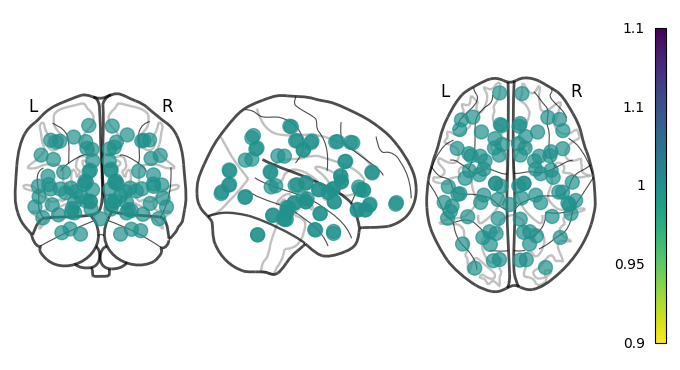

In [61]:
plotting.plot_markers(node_values, node_coords, node_size='auto')

# Visualizacion de subespacios

In [28]:
def align_Xs(reference_matrix, veps):
    """
    An auxiliary function that Procrustes-aligns two embeddings.
    Parameters
    ----------
    X1 : an array-like with the embeddings to be aligned
    X2 : an array-like with the embeddings to align X1 to
    Returns
    -------
    X1_aligned : the aligned version of X1 to X2.
    """

    V,_,Wt = np.linalg.svd(veps.T @ reference_matrix) # voy hallando la transformacion para cada uno de ellos
    U = V @ Wt
    aligned_veps = veps @ U

    return aligned_veps

def plot_close_veps(adjacencies, normed=False, proximity_threshold=0.001):
    total_vaps = []
    total_veps = []
    
    for i, adjacency in enumerate(adjacencies.T):
        L = laplacian(adjacency, normed=normed)
        vaps, veps = eigh(L)
        total_vaps.append(vaps)
        total_veps.append(veps)
        if i==0:
            reference_matrix = veps

    # Proceso para identificar y mostrar los vectores propios de valores propios cercanos entre diferentes grafos
    for i, (vaps_i, veps_i) in enumerate(zip(total_vaps, total_veps)):
        for j, (vaps_j, veps_j) in enumerate(zip(total_vaps, total_veps)):
            if i != j:  # Solo comparar entre diferentes grafos
                close_indices = np.where(np.abs(vaps_i - vaps_j) < proximity_threshold)[0]
                for index in close_indices:
                    if index != 0:
                        dot_product = np.dot(veps_i[:, index], veps_j[:, index])
                        norms = np.linalg.norm(veps_i[:, index]) * np.linalg.norm(veps_j[:, index])
                        cosine_similarity = dot_product / norms
                        
                        aligned_vepsi = align_Xs(reference_matrix, veps_i)
                        aligned_vepsj = align_Xs(reference_matrix, veps_j)

                        if np.abs(cosine_similarity) > 0.9:  # Verificar si apuntan en la misma dirección
                            # print(f"Vectores propios cercanos entre grafo {i+1} y grafo {j+1}, indices {index} y {index}:")
                            # print(f"Valor propio en grafo {i+1}: {vaps_i[index]}, Vector propio: {veps_i[:, index]}")
                            # print(f"Valor propio en grafo {j+1}: {vaps_j[index]}, Vector propio: {veps_j[:, index]}")
                            
                            # Gráfica de los vectores propios como matrices 1D
                            
                            plt.figure(figsize=(8, 8))
                            plt.subplot(1, 2, 1)
                            plt.imshow(veps_i[:, index:index+1], aspect='auto', cmap='viridis')
                            cbar = plt.colorbar()
                            cbar.ax.tick_params(labelsize=12)
                            plt.title(f"Grafo {i+1} VEP {index}", fontsize = 16)
                            plt.gca().set_xticks([])  # Eliminar ticks del eje x
                            plt.yticks(fontsize=12)

                            plt.subplot(1, 2, 2)
                            plt.imshow(veps_j[:, index:index+1], aspect='auto', cmap='viridis')
                            cbar = plt.colorbar()
                            cbar.ax.tick_params(labelsize=12)
                            plt.title(f"Grafo {j+1} VEP {index}", fontsize = 16)
                            plt.gca().set_xticks([])  # Eliminar ticks del eje x
                            plt.yticks(fontsize=12)
                            plt.subplots_adjust(wspace=0.3)

                            plt.show()

                            plt.figure(figsize=(8, 8))

                            plt.subplot(1, 2, 1)
                            plt.imshow(aligned_vepsi[:, index:index+1], aspect='auto', cmap='viridis')
                            cbar = plt.colorbar()
                            cbar.ax.tick_params(labelsize=12)
                            plt.title(f"Grafo {i+1} VEP alineado {index}", fontsize = 16)
                            plt.gca().set_xticks([])  # Eliminar ticks del eje x
                            plt.yticks(fontsize=12)

                            plt.subplot(1, 2, 2)
                            plt.imshow(aligned_vepsj[:, index:index+1], aspect='auto', cmap='viridis')
                            cbar = plt.colorbar()
                            cbar.ax.tick_params(labelsize=12)
                            plt.title(f"Grafo {j+1} VEP alineado {index}", fontsize = 16)
                            plt.gca().set_xticks([])  # Eliminar ticks del eje x
                            plt.yticks(fontsize=12)
                            plt.subplots_adjust(wspace=0.3)
                            
                            plt.show()
                             
        break


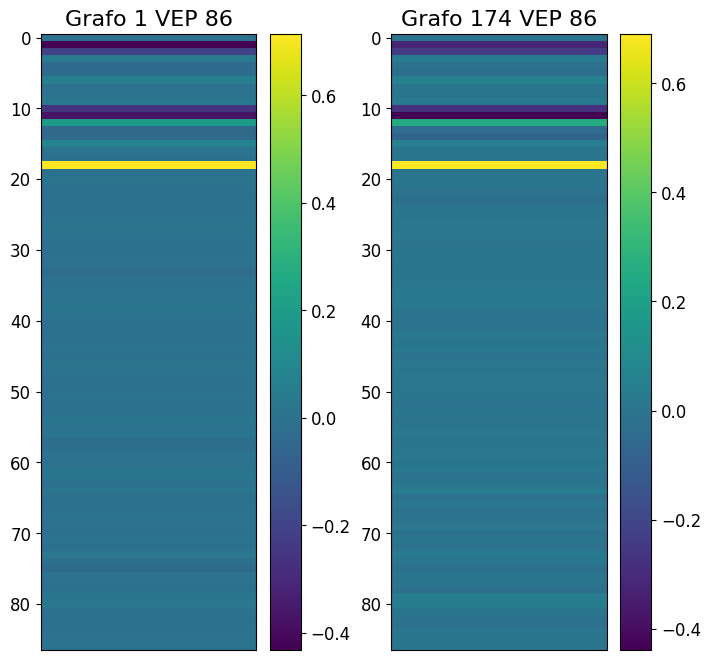

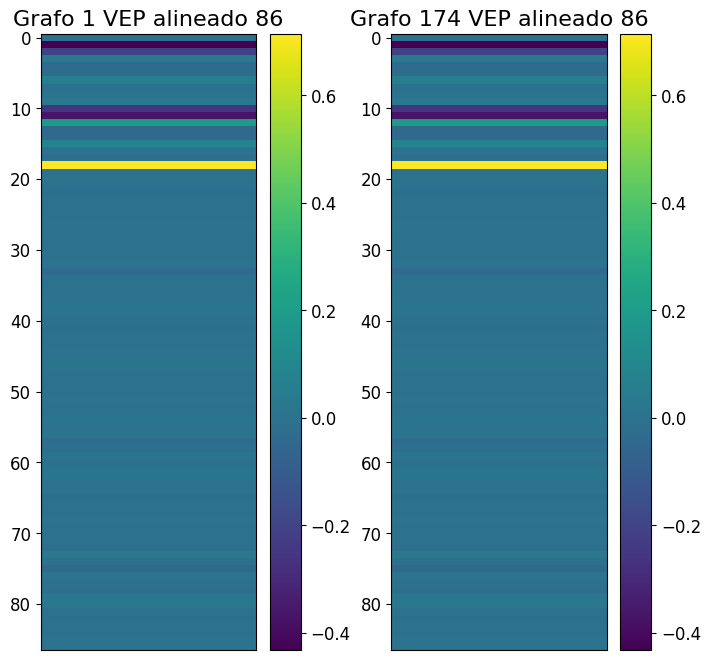

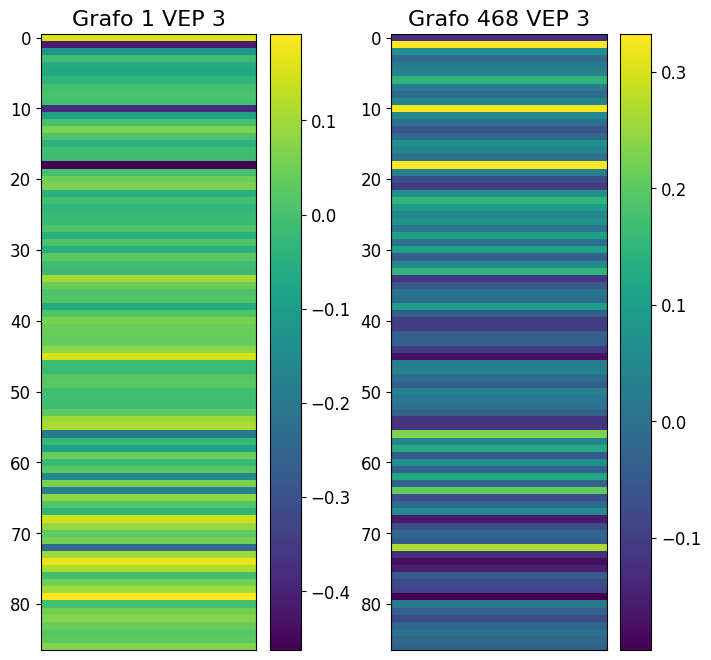

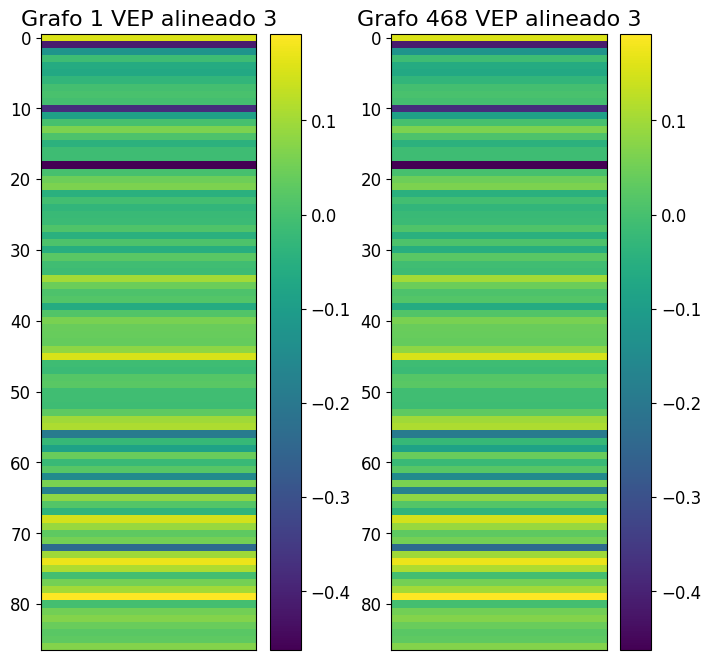

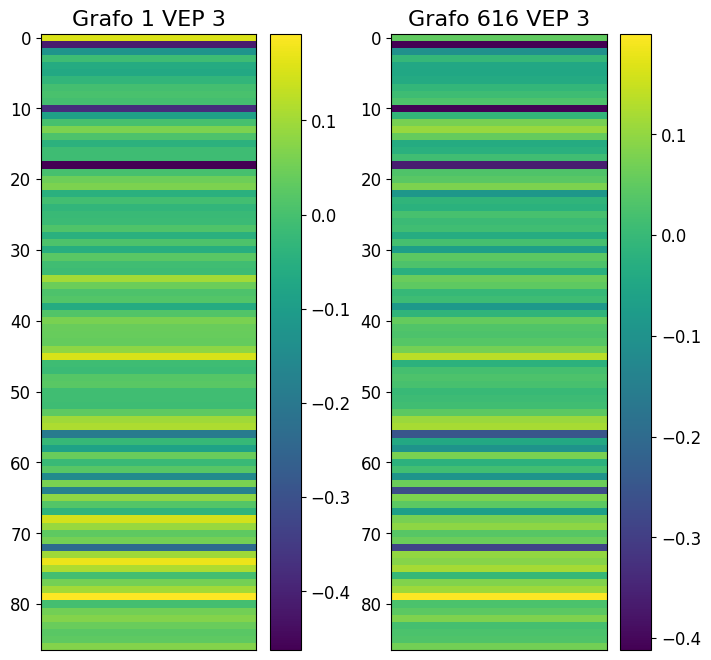

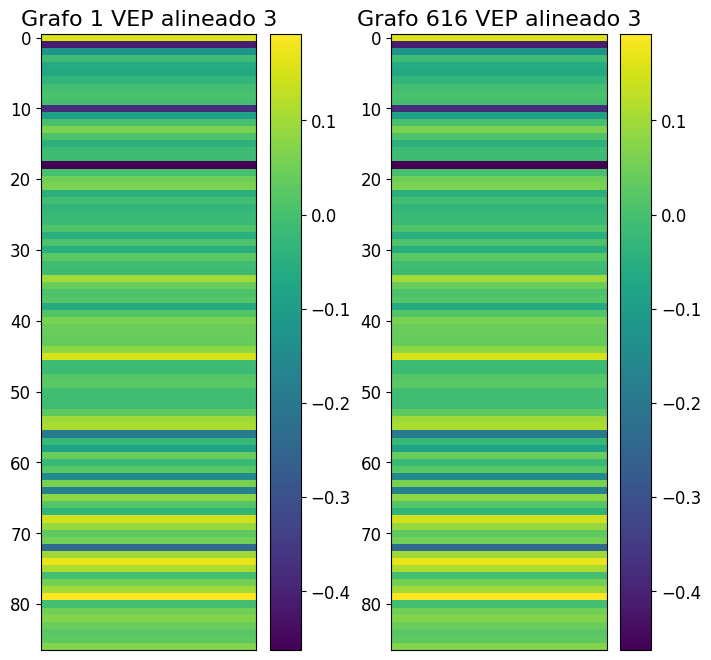

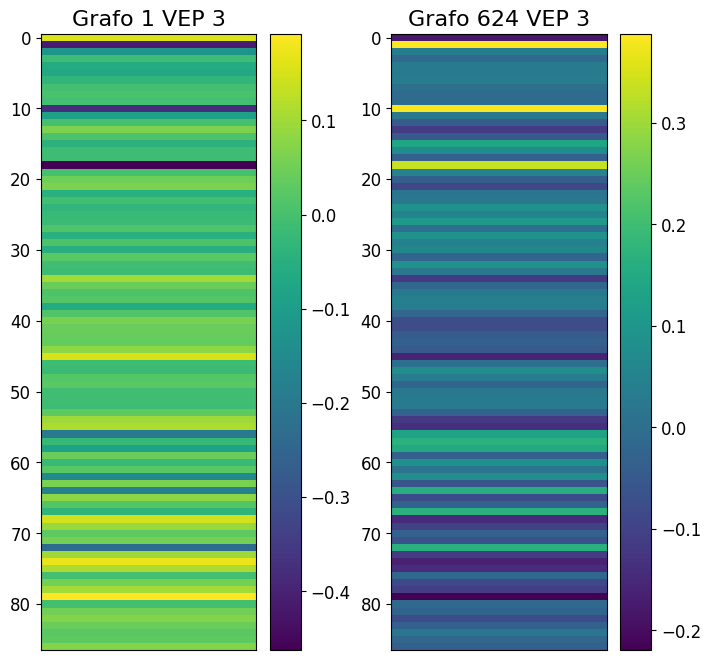

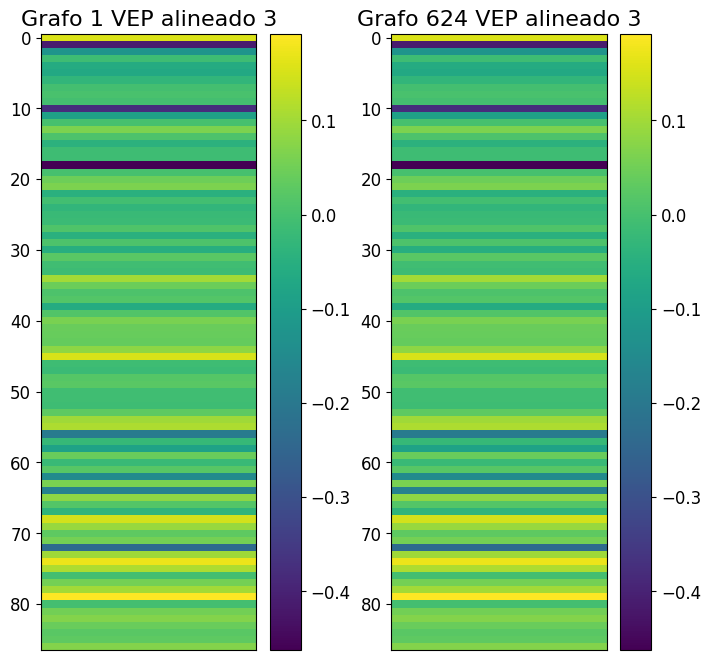

In [29]:
plot_close_veps(matrix.astype('float32'), normed=True, proximity_threshold=0.0001)

# Visualizacion 3d de veps

In [33]:
def align_Xs(reference_matrix, veps):
    """
    An auxiliary function that Procrustes-aligns two embeddings.
    Parameters
    ----------
    X1 : an array-like with the embeddings to be aligned
    X2 : an array-like with the embeddings to align X1 to
    Returns
    -------
    X1_aligned : the aligned version of X1 to X2.
    """

    V,_,Wt = np.linalg.svd(veps.T @ reference_matrix) # voy hallando la transformacion para cada uno de ellos
    U = V @ Wt
    aligned_veps = veps @ U

    return aligned_veps

def plot_veps3d(adjacencies, normed=False):
    total_vaps = []
    total_veps = []
    total_aligned_veps = []

    for i, adjacency in enumerate(adjacencies.T):
        L = laplacian(adjacency, normed=normed)
        vaps, veps = eigh(L)
        total_vaps.append(vaps)
        total_veps.append(veps)
        if i==0:
            reference_matrix = veps
        else:
            aligned_veps = align_Xs(reference_matrix, veps)
            total_aligned_veps.append(aligned_veps)
        
    idx = random.randint(0, 1065)
    print(idx)
    veps_idx_naligned = total_veps[idx][:, :3]
    veps_idx_aligned = total_aligned_veps[idx][:, :3]

    veps_0_aligned = total_veps[0][:, :3]
    
    fig = plt.figure(figsize=(12, 6))
    ax1 = fig.add_subplot(131, projection='3d')
    ax1.scatter(veps_idx_naligned[:, 0], veps_idx_naligned[:, 1], veps_idx_naligned[:, 2], c='r', label='Non-aligned')
    ax1.set_title(f"87 nodos del sujeto {idx} sin alinear")
    ax1.set_xlabel('Component 1')
    ax1.set_ylabel('Component 2')
    ax1.set_zlabel('Component 3')
    
    ax2 = fig.add_subplot(132, projection='3d')
    ax2.scatter(veps_idx_aligned[:, 0], veps_idx_aligned[:, 1], veps_idx_aligned[:, 2], c='b', label='Aligned')
    ax2.set_title(f"87 nodos del sujeto {idx} alineados a la referencia")
    ax2.set_xlabel('Component 1')
    ax2.set_ylabel('Component 2')
    ax2.set_zlabel('Component 3')
    
    ax3 = fig.add_subplot(133, projection='3d')
    ax3.scatter(veps_0_aligned[:, 0], veps_0_aligned[:, 1], veps_0_aligned[:, 2], c='b', label='Aligned')
    ax3.set_title("Vectores de referencia")
    ax3.set_xlabel('Component 1')
    ax3.set_ylabel('Component 2')
    ax3.set_zlabel('Component 3')

    plt.show()
    

def plot_nodo_n_veps3d(adjacencies, n, normed=False):
    total_vaps = []
    total_veps = []
    total_aligned_veps = []

    for i, adjacency in enumerate(adjacencies.T):
        L = laplacian(adjacency, normed=normed)
        vaps, veps = eigh(L)
        total_vaps.append(vaps)
        total_veps.append(veps)
        if i==0:
            reference_matrix = veps
        else:
            aligned_veps = align_Xs(reference_matrix, veps)
            total_aligned_veps.append(aligned_veps)

    veps_idx_naligned = np.array(total_veps)[:, n, :3]
    veps_idx_aligned = np.array(total_aligned_veps)[:, n, :3]
    
    fig = plt.figure(figsize=(12, 6))
    ax1 = fig.add_subplot(131, projection='3d')
    ax1.scatter(veps_idx_naligned[:, 0], veps_idx_naligned[:, 1], veps_idx_naligned[:, 2], c='r', label='Non-aligned')
    ax1.set_title(f"De cada sujeto el nodo {n}, sin alinear")
    ax1.set_xlabel('Component 1')
    ax1.set_ylabel('Component 2')
    ax1.set_zlabel('Component 3')
    
    ax2 = fig.add_subplot(132, projection='3d')
    ax2.scatter(veps_idx_aligned[:, 0], veps_idx_aligned[:, 1], veps_idx_aligned[:, 2], c='b', label='Aligned')
    ax2.set_title(f"De cada sujeto el nodo {n}, alineado")
    ax2.set_xlabel('Component 1')
    ax2.set_ylabel('Component 2')
    ax2.set_zlabel('Component 3')
    
    plt.show()
    

def plot_nodo_n_veps2d(adjacencies, n, normed=False):
    total_vaps = []
    total_veps = []
    total_aligned_veps = []

    for i, adjacency in enumerate(adjacencies.T):
        L = laplacian(adjacency, normed=normed)
        vaps, veps = eigh(L)
        total_vaps.append(vaps)
        total_veps.append(veps)
        if i==0:
            reference_matrix = veps
        else:
            aligned_veps = align_Xs(reference_matrix, veps)
            total_aligned_veps.append(aligned_veps)
            
    veps_idx_naligned = np.array(total_veps)[:, n, :2]
    veps_idx_aligned = np.array(total_aligned_veps)[:, n, :2]
    
    fig = plt.figure(figsize=(12, 6))
    ax1 = fig.add_subplot(131)
    ax1.scatter(veps_idx_naligned[:, 0], veps_idx_naligned[:, 1], c='r', label='Non-aligned')
    ax1.set_title(f"De cada sujeto el nodo {n}, sin alinear")
    ax1.set_xlabel('Component 1')
    ax1.set_ylabel('Component 2')
    
    ax2 = fig.add_subplot(132)
    ax2.scatter(veps_idx_aligned[:, 0], veps_idx_aligned[:, 1], c='b', label='Aligned')
    ax2.set_title(f"De cada sujeto el nodo {n}, alineado")
    ax2.set_xlabel('Component 1')
    ax2.set_ylabel('Component 2')

    plt.show()
    

def plot_veps2d(adjacencies, normed=False):
    total_vaps = []
    total_veps = []
    total_aligned_veps = []

    
    for i, adjacency in enumerate(adjacencies.T):
        L = laplacian(adjacency, normed=normed)
        vaps, veps = eigh(L)
        total_vaps.append(vaps)
        total_veps.append(veps)
        if i==0:
            reference_matrix = veps
        else:
            aligned_veps = align_Xs(reference_matrix, veps)
            total_aligned_veps.append(aligned_veps)
        
    idx = random.randint(0, 1065)
    print(idx)
    veps_idx_naligned = total_veps[idx][:, :2]
    veps_idx_aligned = total_aligned_veps[idx][:, :2]
    
    veps_0_aligned = total_veps[0][:, :2]
    
    fig = plt.figure(figsize=(12, 6))
    ax1 = fig.add_subplot(131)
    ax1.scatter(veps_idx_naligned[:, 0], veps_idx_naligned[:, 1], c='r', label='Non-aligned')
    ax1.set_title("Non-Aligned Eigen Vectors")
    ax1.set_xlabel('Component 1')
    ax1.set_ylabel('Component 2')
    
    ax2 = fig.add_subplot(132)
    ax2.scatter(veps_idx_aligned[:, 0], veps_idx_aligned[:, 1], c='b', label='Aligned')
    ax2.set_title("Aligned Eigen Vectors")
    ax2.set_xlabel('Component 1')
    ax2.set_ylabel('Component 2')
    
    ax3 = fig.add_subplot(133)
    ax3.scatter(veps_0_aligned[:, 0], veps_0_aligned[:, 1], c='b', label='Aligned')
    ax3.set_title("Reference Eigen Vectors")
    ax3.set_xlabel('Component 1')
    ax3.set_ylabel('Component 2')

    plt.show()


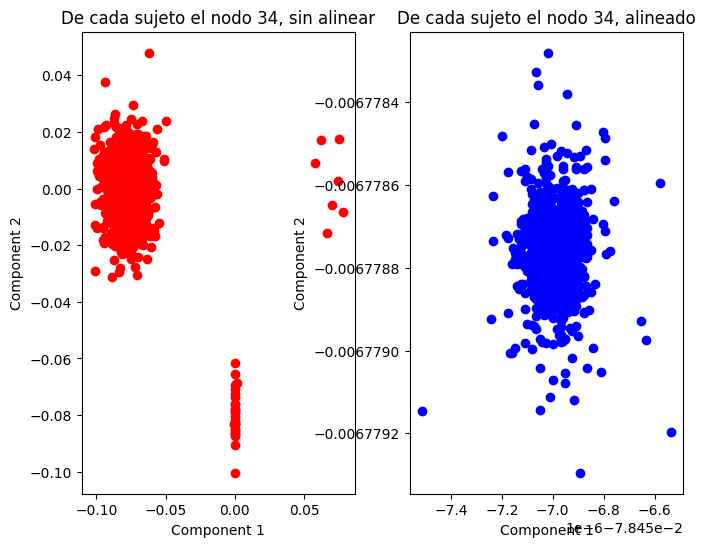

In [38]:
plot_nodo_n_veps2d(matrix.astype('float32'), 34, normed=True)

674


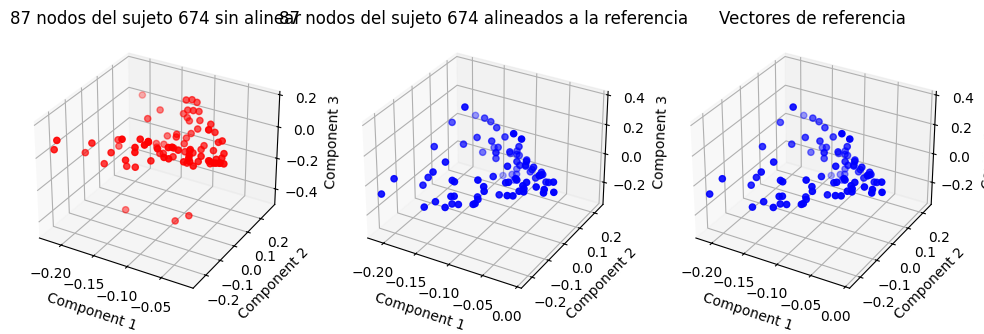

In [35]:
plot_veps3d(matrix.astype('float32'), normed=True)

613


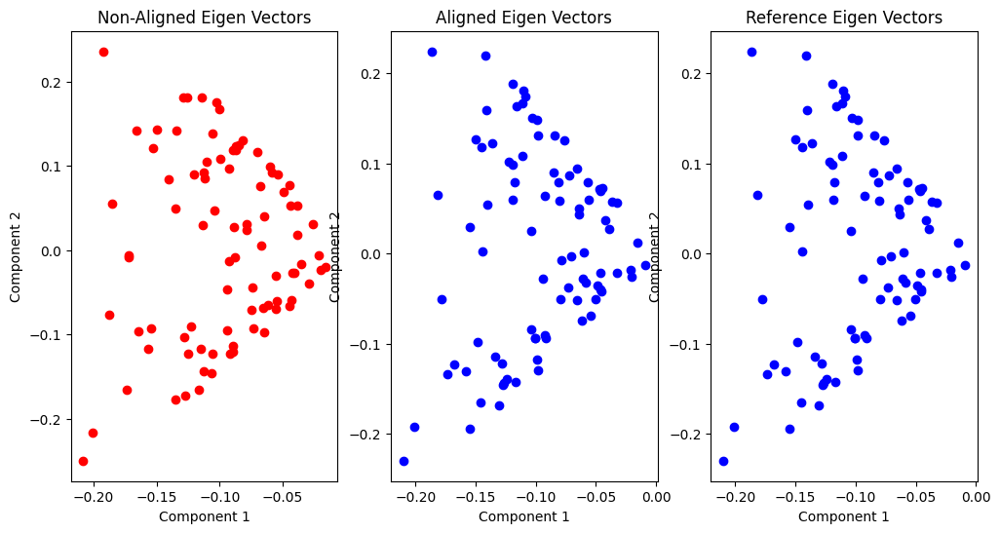

In [48]:
plot_veps2d(matrix.astype('float32'), normed=True)

# UASE

## Pruebas

In [16]:
def right_embed(As, d, n):
    # Construct rectangular matrices
    if len(As.shape) == 2:
        As = np.array([As[:,:]])
    
    if len(As.shape) == 3:
        T = len(As)
        A = As[0,:,:]
        for t in range(1,T):
            A = np.block([A,As[t]])
    
    # Spectral embeddings
    UA, SA, VAt = np.linalg.svd(A); VA = VAt.T

    YA = np.zeros((T,n,d))
    for t in range(T):
        YA[t] = VA[t*n:(t+1)*n,0:d].dot(np.diag(np.sqrt(SA[0:d])))
        
    return YA

In [17]:
YA = right_embed(matrix.astype('float32')[:, :, :300].T, d = 10, n = 87)

In [18]:
YA.shape

(300, 87, 10)

In [ ]:
np.save('/home/personal/Documents/2023_2/tesis/GNN-BAA/GRL_pytorch/data/embedings/uase_10.npy', YA, allow_pickle=True, fix_imports=True)

# BONDI

Genera un embedding distinto para cada uno pero lo hace a partir de generar un monstruo de matriz de Nm x Nm:

\begin{align}
\begin{bmatrix}
A^{(1)} & \frac{A^{(1)} + A^{(2)}}{2} \\
\frac{A^{(2)} + A^{(1)}}{2} & A^{(2)} \\
\end{bmatrix}
\end{align}

En el tutorial que miré no usan el de graspologic completo sino que calculan ellos así que eso es lo que voy a usar, o sea dicen que una vez que tengo esa matriz enorme puedo hallar embeddings como los de toda la vida que van a quedar mucho más chicos y "dividiendo" en el tamaño completo puedo volver.
El problema más grande que yo veo es que no puedo meter a todos los sujetos, entonces no van a estar todos exactamente en el mismo espacio latente

## Con todo lo de graspologic

### Una primera visualizacion

In [19]:
idx = 200
data_list = matrix[:, :, :idx].astype('float32')

In [20]:
bondi = BONDI(n_components = 10, algorithm = 'truncated')
X = bondi.fit_transform(data_list.T)

In [23]:
X.shape

(200, 87, 10)

Ese X es una tupla y cada entrada es de shape (200, 87, 2), o sea que tiene los 200 embeddings, uno por cada nodo, de dimensión 2.

In [24]:
un_sujeto = X[0, :, :]

In [25]:
un_sujeto.shape

(87, 10)

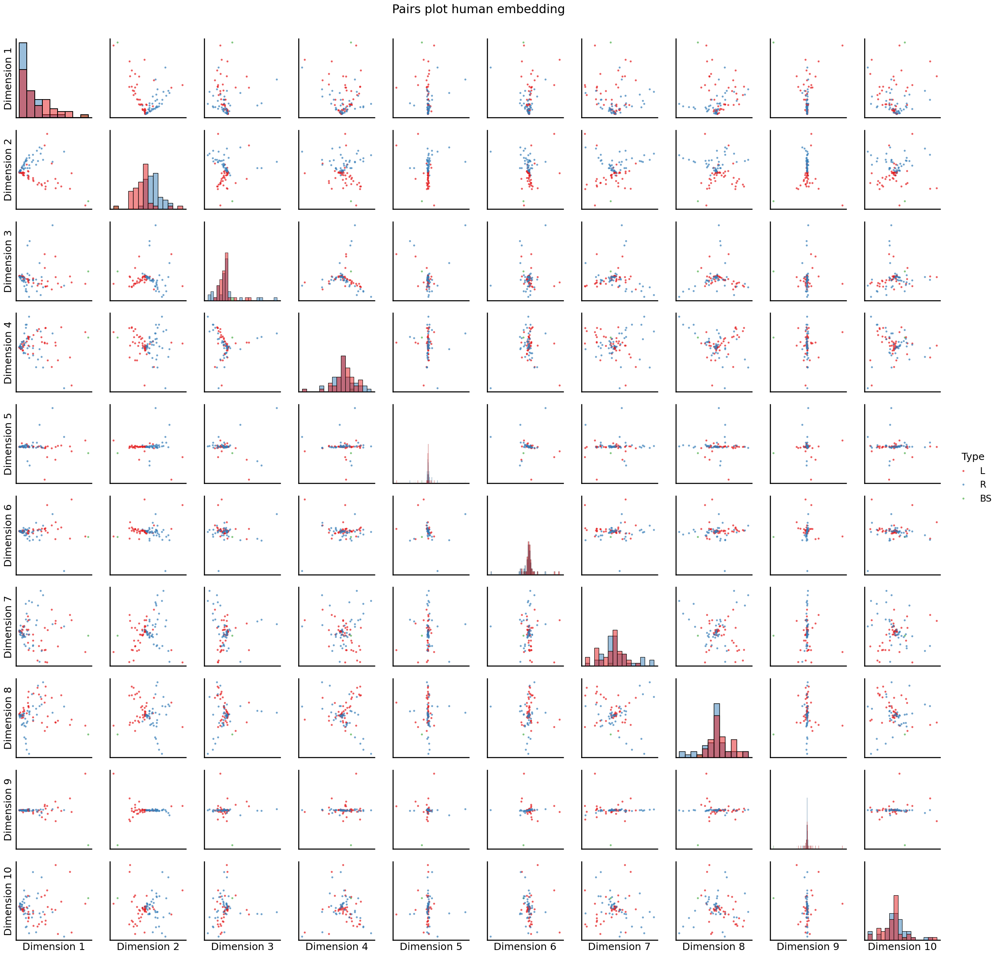

In [26]:
un_sujeto = X[0, :, :]

_ = pairplot(un_sujeto, title="Pairs plot human embedding", labels=human_labs)

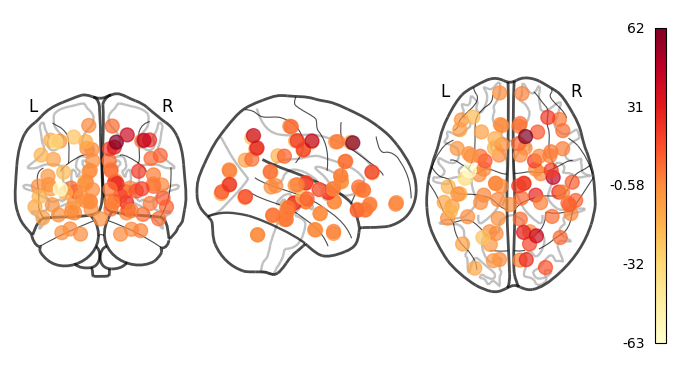

In [41]:
plotting.plot_markers(un_sujeto[:, 1], node_coords, node_size='auto', node_cmap=cm.YlOrRd)

Mas dimensiones:

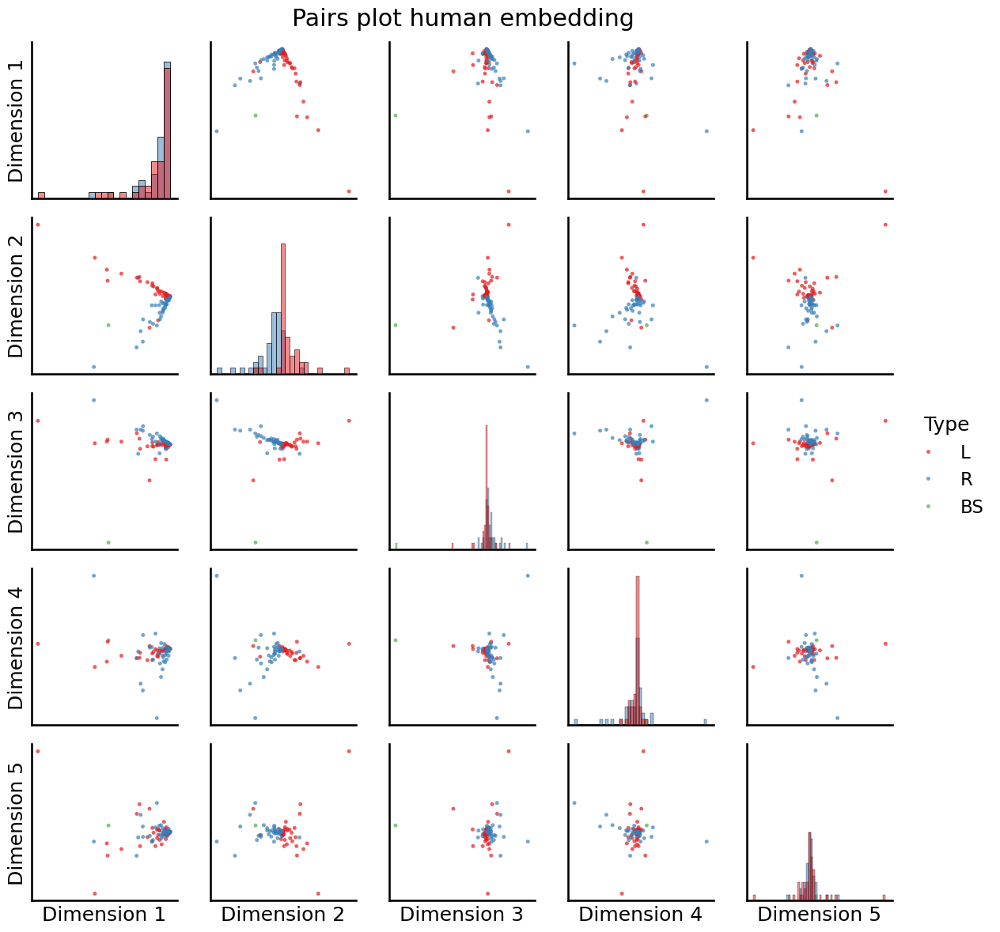

In [6]:
bondi = BONDI(n_components = 5, algorithm = 'truncated')
X = bondi.fit_transform(data_list.T)
un_sujeto = X[0][0, :, :]
_ = pairplot(un_sujeto, title="Pairs plot human embedding", labels=human_labs)

### Generalizamos

In [25]:
matrix.shape

(87, 87, 1065)

In [12]:
def bondi_method(n_components, dimensions_to_view_on_brain, rate = 200):
    X_total = np.zeros((1065, 87, n_components))
    borders = np.arange(0, 1065 + rate, rate)  # Extend range to ensure 1065 is included
    borders[-1] = 1065
    for i, border in enumerate(borders[1:]):
        data_list = matrix[:, :, borders[i]:border].astype('float32')
        bondi = BONDI(n_components = n_components, algorithm = 'truncated')
        X = bondi.fit_transform(data_list.T)
        X_total[borders[i]:border, :, :] = X
        
    idx = random.randint(0, 1065)
    un_sujeto = X_total[idx, :, :]

    _ = pairplot(un_sujeto, title="Pairs plot human embedding", labels=human_labs)
    
    for dimension in dimensions_to_view_on_brain:
        plotting.plot_markers(un_sujeto[:, dimension], node_coords, node_size='auto', node_cmap=cm.YlOrRd)
        
    return X_total

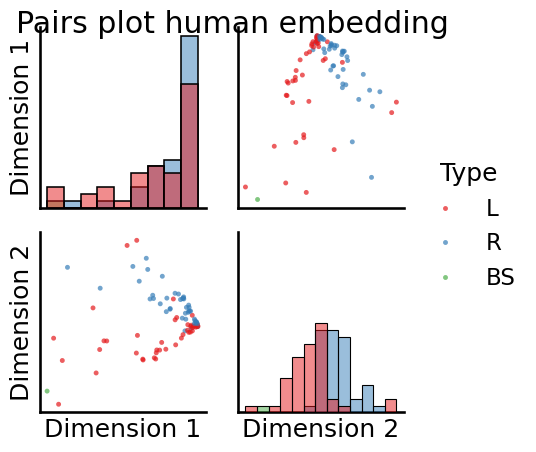

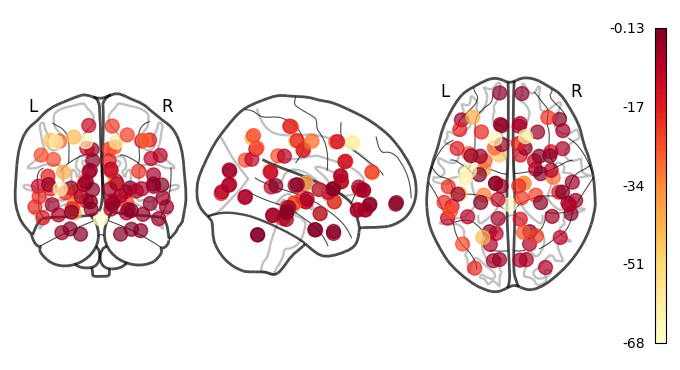

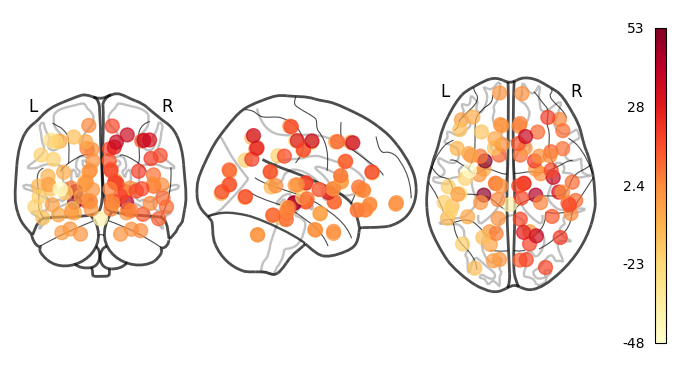

In [10]:
X_total = bondi_method(2, [0, 1], rate = 200)

In [30]:
X_total.shape

(1065, 87, 2)

In [31]:
np.save('/home/personal/Documents/2023_2/tesis/GNN-BAA/GRL_pytorch/data/embedings/bondi_2.npy', X_total, allow_pickle=True, fix_imports=True)

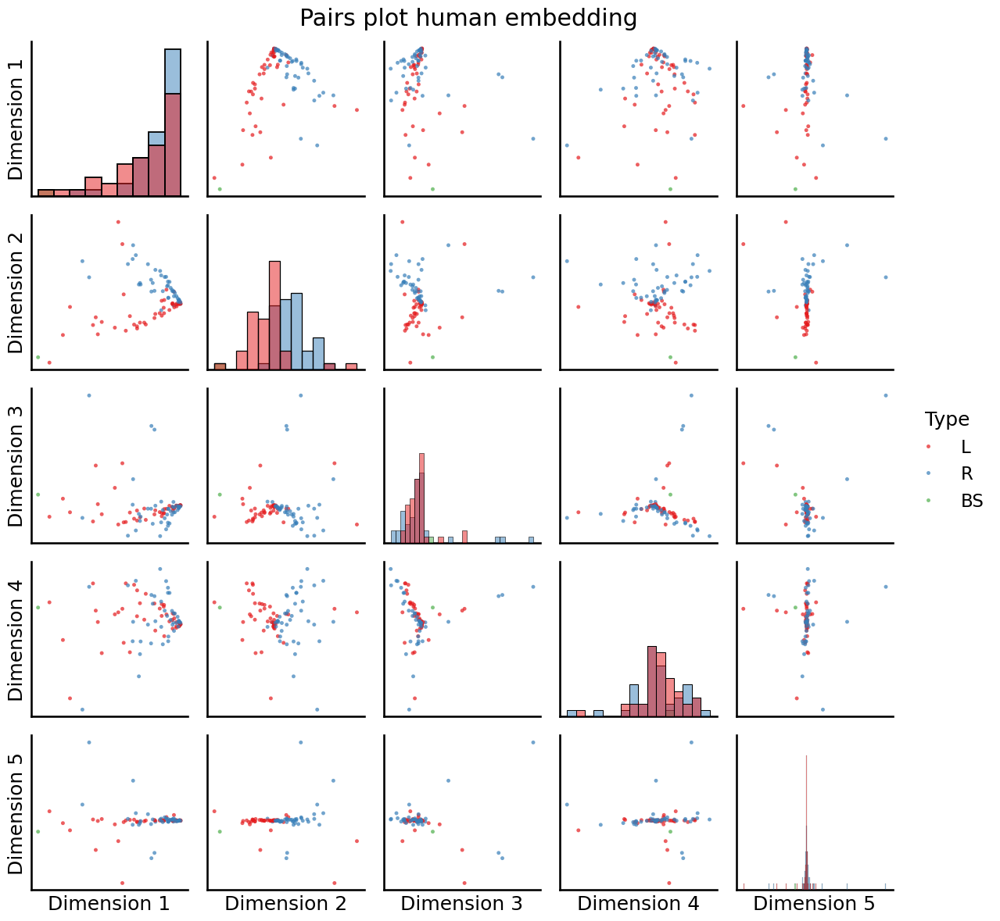

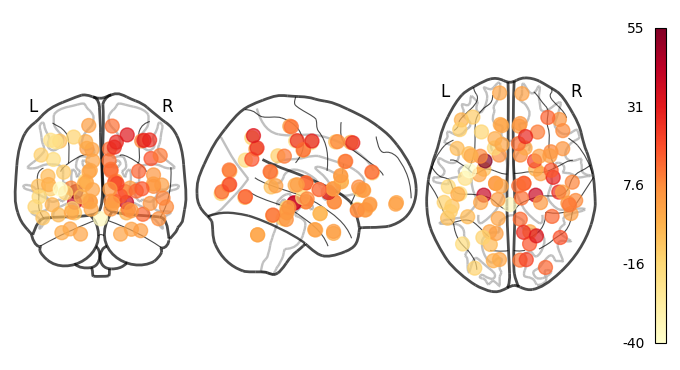

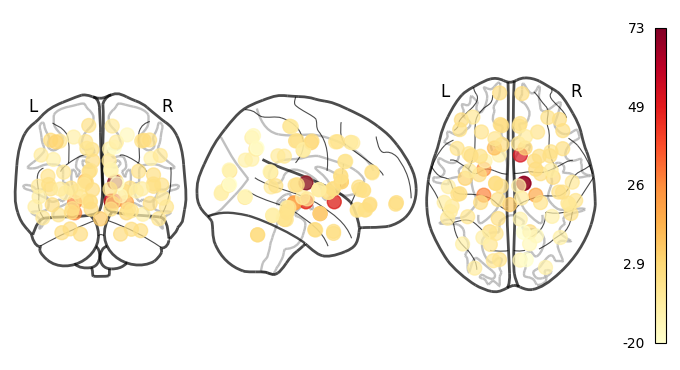

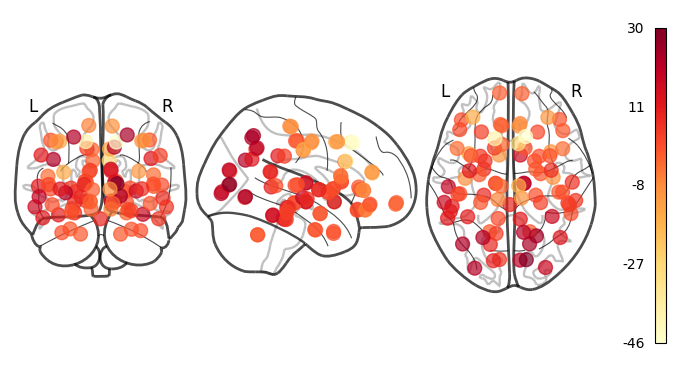

In [14]:
X_total = bondi_method(5, [ 1, 2, 3], rate = 200)

In [13]:
print(X_total.shape)
np.save('/home/personal/Documents/2023_2/tesis/GNN-BAA/GRL_pytorch/data/embedings/bondi_4.npy', X_total, allow_pickle=True, fix_imports=True)

(1065, 87, 4)


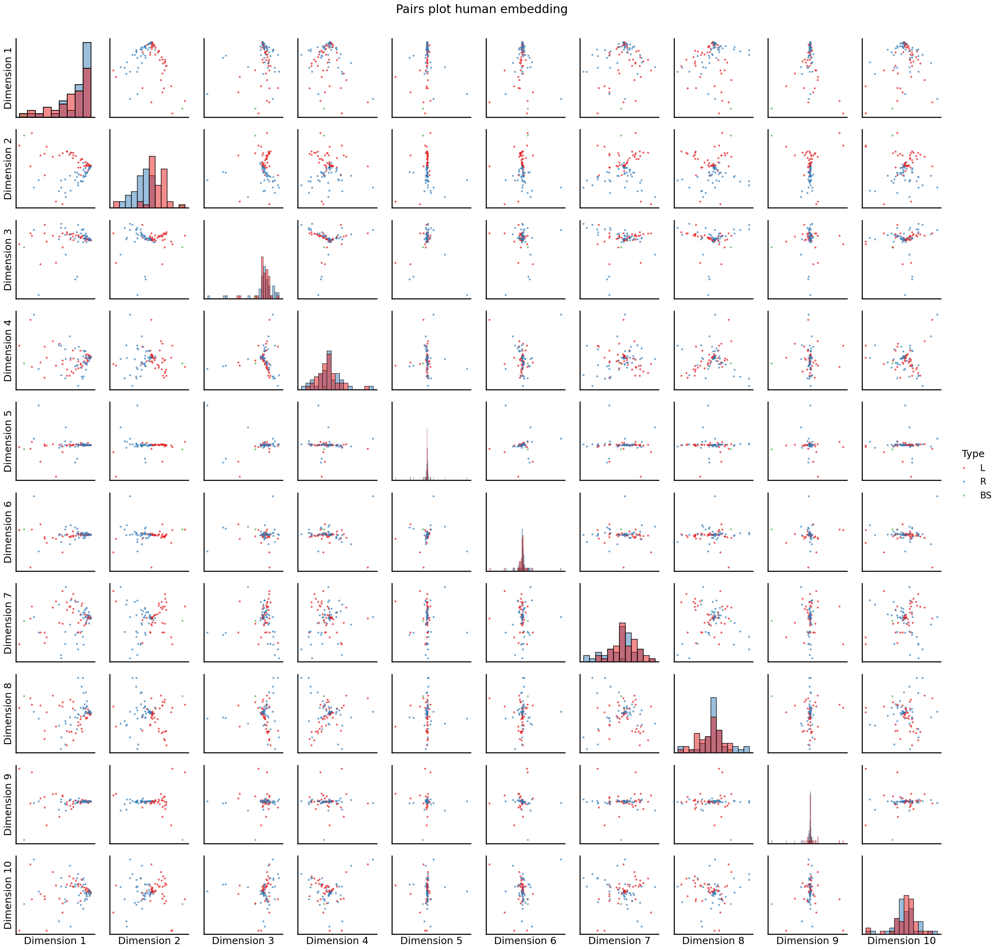

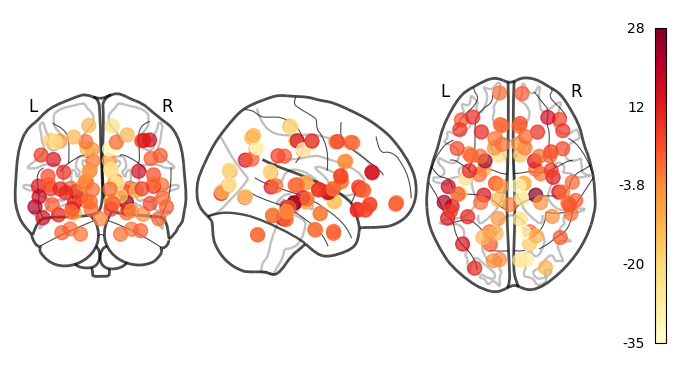

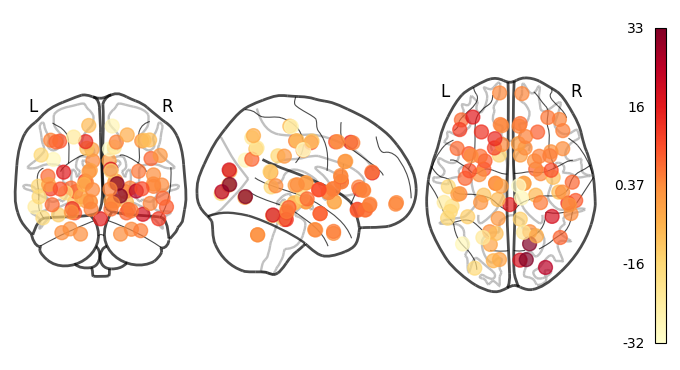

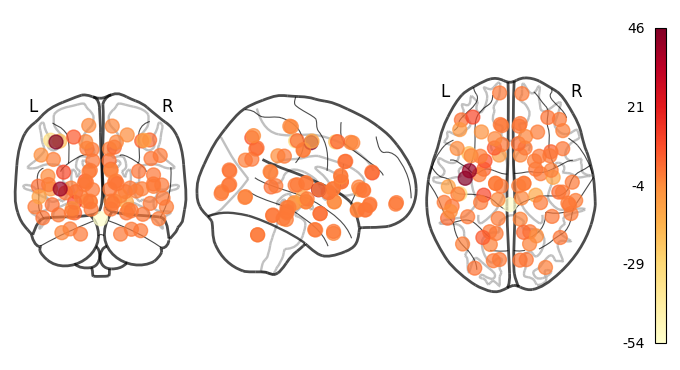

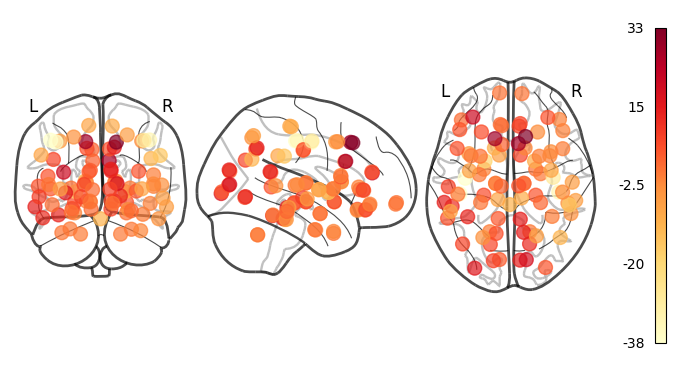

In [13]:
X_total = bondi_method(10, [ 6, 7, 8, 9], rate = 200)


In [11]:
print(X_total.shape)
np.save('/home/personal/Documents/2023_2/tesis/GNN-BAA/GRL_pytorch/data/embedings/bondi_10.npy', X_total, allow_pickle=True, fix_imports=True)

(1065, 87, 10)


In [13]:
rate = 200
borders = np.arange(0, 1065 + rate, rate)  # Extend range to ensure 1065 is included
borders[-1] = 1065
for i, border in enumerate(borders[1:]):
    data_list = matrix[:, :, borders[i]:border].astype('float32')
    bondi = BONDI()
    X = bondi.fit_transform(data_list.T)
    print(X.shape)

(200, 87, 5)
(200, 87, 5)
(200, 87, 5)
(200, 87, 5)
(200, 87, 5)
(65, 87, 5)


## Con su metodo

In [14]:
def plot__omnibus_vaps_distribution(rate):
    total_vaps = []
    borders = np.arange(0, 1065 + rate, rate)  # Extend range to ensure 1065 is included
    borders[-1] = 1065
    for i, border in enumerate(borders[1:]):
        data_list = matrix[:, :, borders[i]:border].astype('float32')
        omni = _get_omni_matrix(data_list.T)
        vaps, _ = eigh(omni)
        total_vaps.append(vaps)
        
    mean_vaps = np.mean(np.array(total_vaps), axis=0)
    variance_vaps = np.var(np.array(total_vaps), axis=0)

    plt.figure(figsize=(8, 4))
    plt.errorbar(range(len(mean_vaps)), mean_vaps, yerr=np.sqrt(variance_vaps), fmt='o', markersize=5,
                 ecolor='red', capsize=5, marker='o', linestyle='-', label='Valor medio de valor propio con su varianza')

    plt.title('Valor medio del espectro de todas las macro adyacencias')
    plt.xlabel('Índice del valor propio')
    plt.ylabel('Valores propios')
    plt.grid(True)
    plt.legend()
    plt.show()

In [15]:
plot__omnibus_vaps_distribution(rate)

In [30]:
idx = 200
data_list = matrix[:, :, :idx].astype('float32')

omni = _get_omni_matrix(data_list.T)
U, D, V = select_svd(omni)
joint_embedding = U @ np.diag(np.sqrt(D))

In [31]:
M = len(data_list.T)
n = len(data_list[0])
latent_networks = joint_embedding.reshape(M, n, -1)

latent_networks.shape

(200, 87, 6)

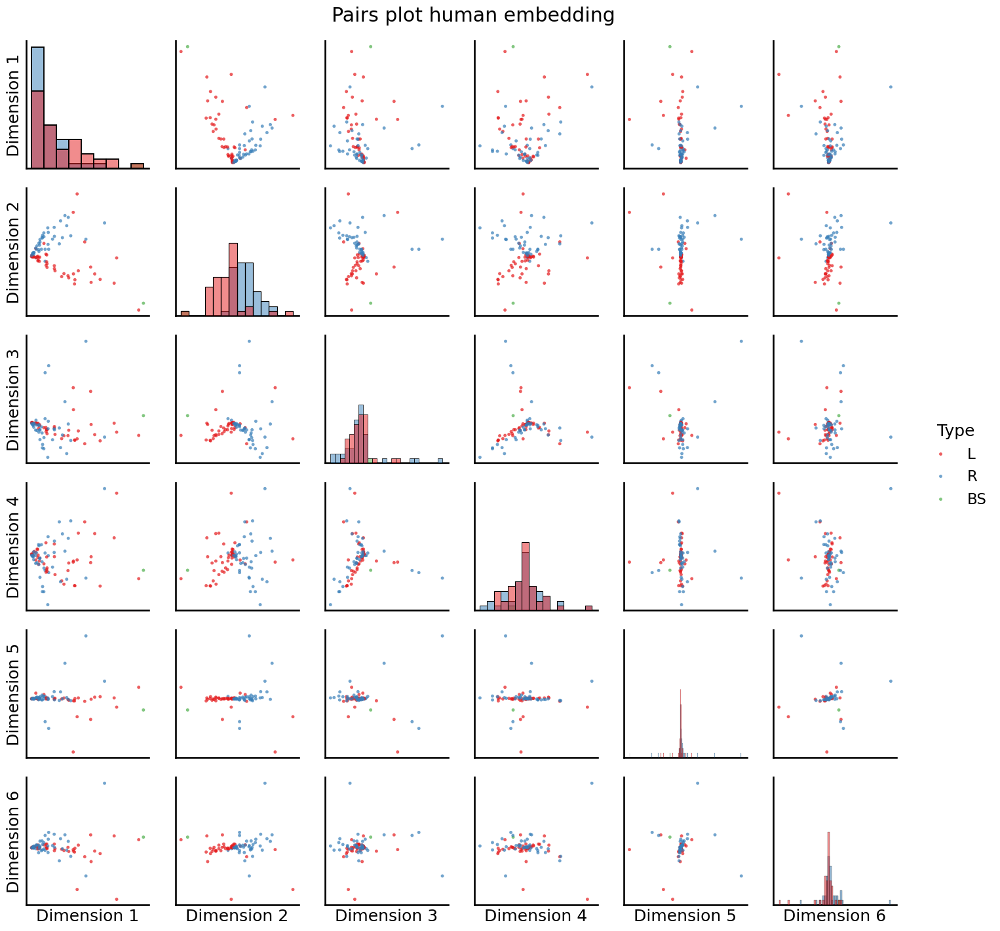

In [32]:
un_sujeto = latent_networks[0, :, :]
_ = pairplot(un_sujeto, title="Pairs plot human embedding", labels=human_labs)

In [ ]:
def bondi_method(n_components, dimensions_to_view_on_brain, rate = 200):
    X_total = np.zeros((1065, 87, n_components))
    borders = np.arange(0, 1065 + rate, rate)  # Extend range to ensure 1065 is included
    borders[-1] = 1065
    for i, border in enumerate(borders[1:]):
        data_list = matrix[:, :, borders[i]:border].astype('float32')
        bondi = BONDI(n_components = n_components, algorithm = 'truncated')
        X = bondi.fit_transform(data_list.T)
        X_total[borders[i]:border, :, :] = X
        
    idx = random.randint(0, 1065)
    un_sujeto = X_total[idx, :, :]

    _ = pairplot(un_sujeto, title="Pairs plot human embedding", labels=human_labs)
    
    for dimension in dimensions_to_view_on_brain:
        plotting.plot_markers(un_sujeto[:, dimension], node_coords, node_size='auto', node_cmap=cm.YlOrRd)

# MASE

In [24]:
def mase_method(n_components, dimensions_to_view_on_brain):
    
    # X_total = np.zeros((1065, 87, n_components))
    # borders = np.arange(0, 1065 + rate, rate)  # Extend range to ensure 1065 is included
    # borders[-1] = 1065
    # for i, border in enumerate(borders[1:]):
    # data_list = matrix[:, :, borders[i]:border].astype('float32')
    
    data_list = matrix[:, :, :].astype('float32')
    mase = MASE(n_components = n_components)
    X_total = mase.fit_transform(data_list.T)
    
    # X_total[borders[i]:border, :, :] = X

    _ = pairplot(X_total, title="Pairs plot human embedding", labels=human_labs)
    
    for dimension in dimensions_to_view_on_brain:
        plotting.plot_markers(X_total[:, dimension], node_coords, node_size='auto', node_cmap=cm.YlOrRd)
        
    return X_total

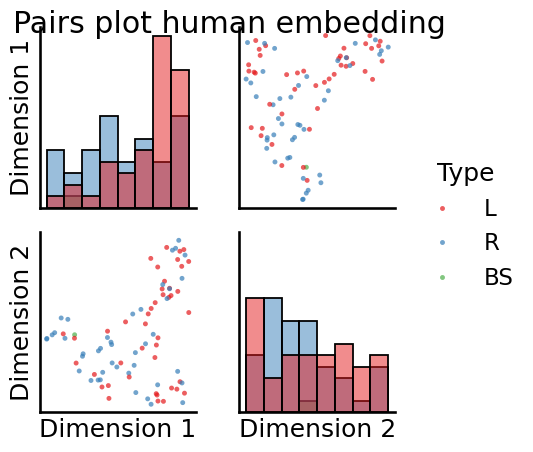

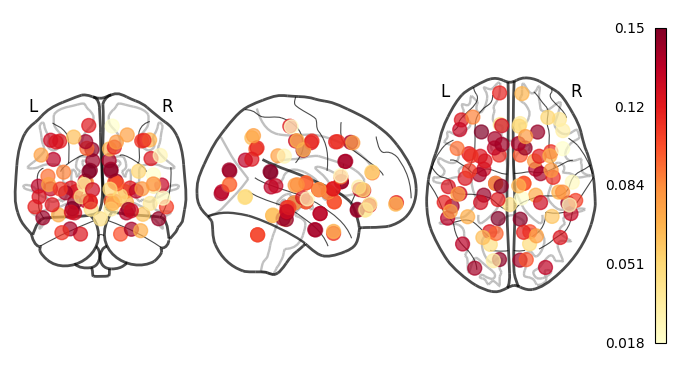

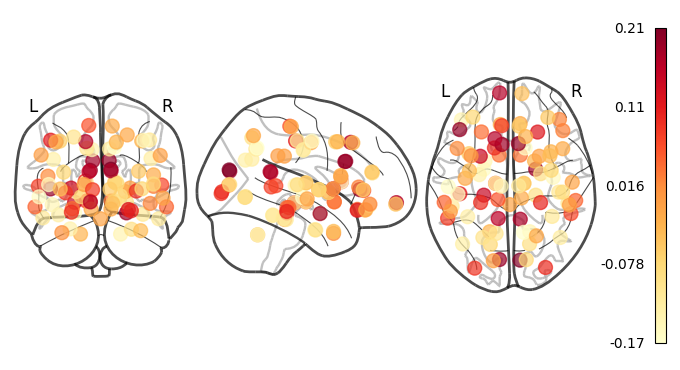

In [25]:
X_total = mase_method(2, [0, 1])

In [38]:
X_total.shape

(87, 2)

In [39]:
np.save('/home/personal/Documents/2023_2/tesis/GNN-BAA/GRL_pytorch/embeddings/offline_embedings/mase_our_2_fc.npy', X_total, allow_pickle=True, fix_imports=True)

(87, 5)


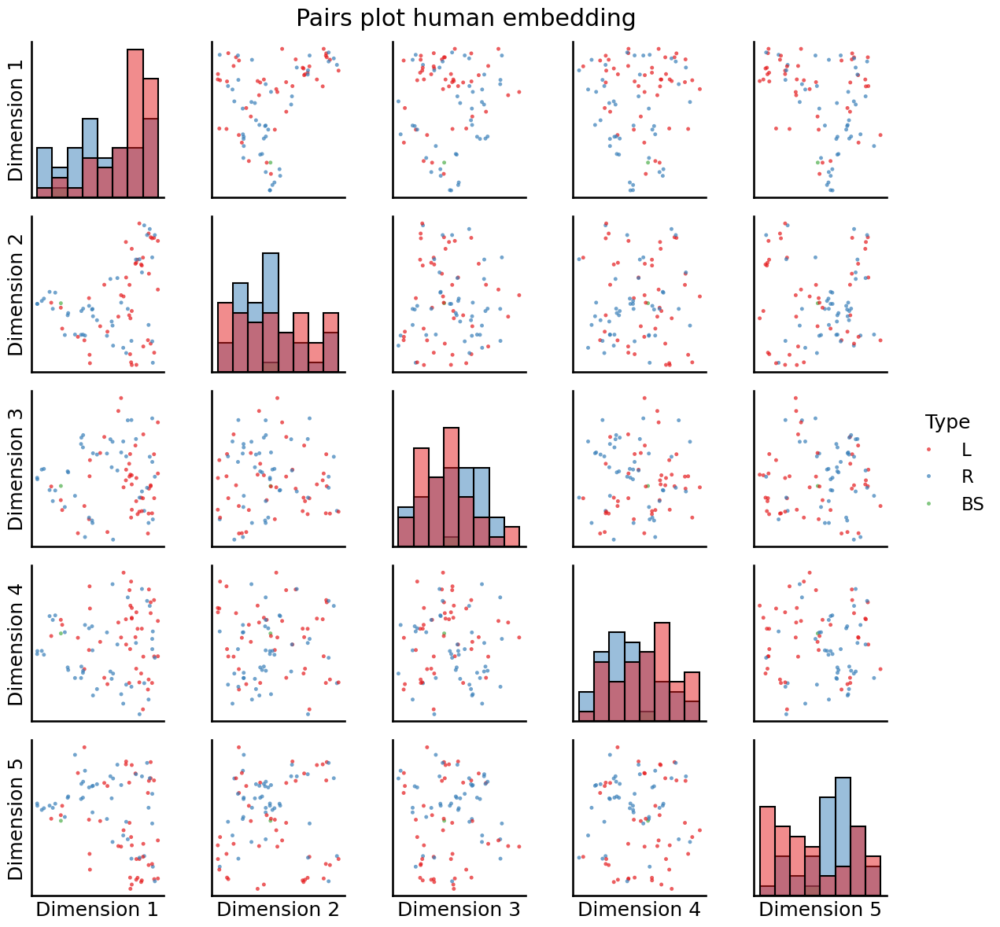

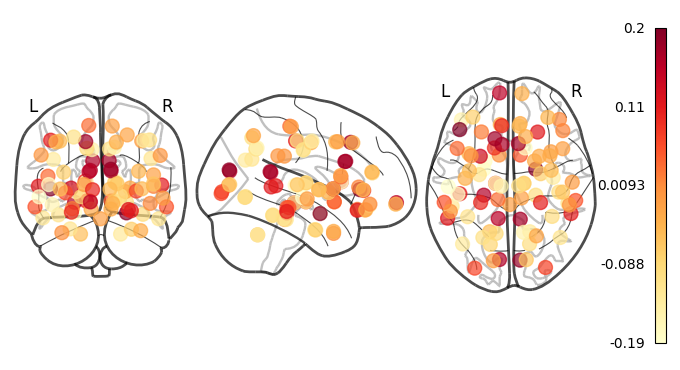

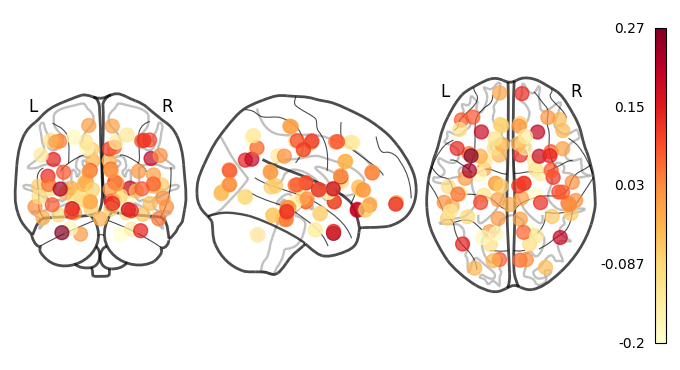

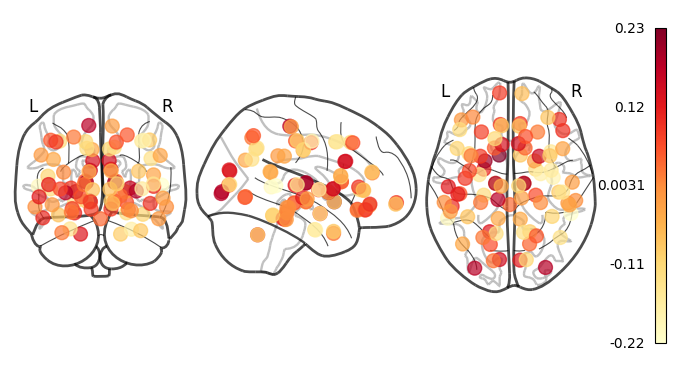

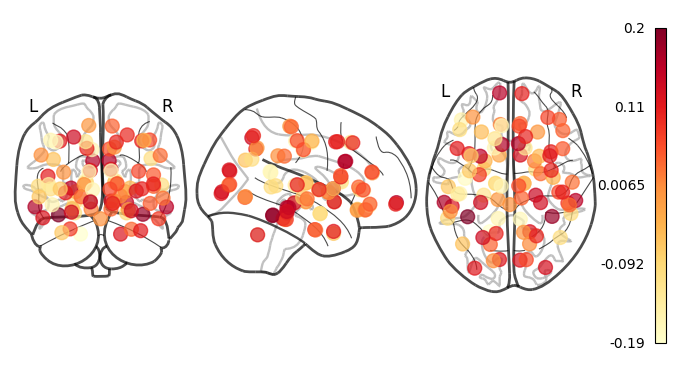

In [26]:
X_total = mase_method(5, [1, 2, 3, 4])
print(X_total.shape)

In [41]:
np.save('/home/personal/Documents/2023_2/tesis/GNN-BAA/GRL_pytorch/embeddings/offline_embedings/mase_our_fc_5.npy', X_total, allow_pickle=True, fix_imports=True)

In [13]:
X_total = mase_method(10, [6, 7, 8, 9])
print(X_total.shape)

(167, 10)


In [14]:
np.save('/home/personal/Documents/2023_2/tesis/GNN-BAA/GRL_pytorch/embeddings/offline_embedings/mase_Destrieux_10.npy', X_total, allow_pickle=True, fix_imports=True)

# Fede

## Ortogonal

In [ ]:
A = matrix[:, : , 0]

nt = A.shape[0]  # Número total de nodos en el grafo
M = np.ones(nt) - np.eye(nt)

d = 2
Ur, Sr, Vrt = sem.rsvd(A, d, 2, 2)
Xrsvd = Ur[:, 0:d].dot(np.diag(np.sqrt(Sr[0: d])))
X_ogd = sem.orthogonal_gradient_descent_RDPG(A, Xrsvd, M)

## No ortogonal

### Exploracion

In [12]:
A = matrix[:, : , 0]

nt = A.shape[0]  # Número total de nodos en el grafo
M = np.ones(nt) - np.eye(nt)

d = 2
Ur, Sr, Vrt = sem.rsvd(A, d, 2, 2)
Xrsvd = Ur[:, 0:d].dot(np.diag(np.sqrt(Sr[0: d])))

w = np.linalg.eigvals(A)
wabs = np.array(list(zip(-np.abs(w), -np.sign(np.real(w)))), dtype=[('abs', 'f4'), ('sign', 'i4')])
w = w[np.argsort(wabs,order=['abs','sign'])]

Q = np.diag(np.sign(w[:d]))

X_gd = sem.gradient_descent_GRDPG(A, Xrsvd, Q, M)

In [13]:
X_gd.shape

(87, 2)

In [14]:
def find_fiori_fede_embedding(matrix, d, dimensions_to_view_on_brain, idx=None, labels=human_labs):
    if idx==None:
        idx = random.randint(0, 1065)
        
    A = matrix[:, :, idx]    
    nt = A.shape[0]  # Número total de nodos en el grafo
    M = np.ones(nt) - np.eye(nt)

    Ur, Sr, _ = sem.rsvd(A, d, 2, 2)
    Xrsvd = Ur[:, 0:d].dot(np.diag(np.sqrt(Sr[0: d])))
    
    w = np.linalg.eigvals(A)
    wabs = np.array(list(zip(-np.abs(w), -np.sign(np.real(w)))), dtype=[('abs', 'f4'), ('sign', 'i4')])
    w = w[np.argsort(wabs,order=['abs','sign'])]
    
    Q = np.diag(np.sign(w[:d]))

    X_gd = sem.gradient_descent_GRDPG(A, Xrsvd, Q, M)
    
    _ = pairplot(X_gd, title="Pairs plot vep embedding", labels=labels)
    
    for dimension in dimensions_to_view_on_brain:
        node_vmin = np.min(X_gd[:, dimension]) - 0.01
        node_vmax = np.max(X_gd[:, dimension]) + 0.01
        plotting.plot_markers(X_gd[:, dimension], node_coords, node_size='auto', node_cmap=cm.YlOrRd, node_vmin=node_vmin, node_vmax=node_vmax)

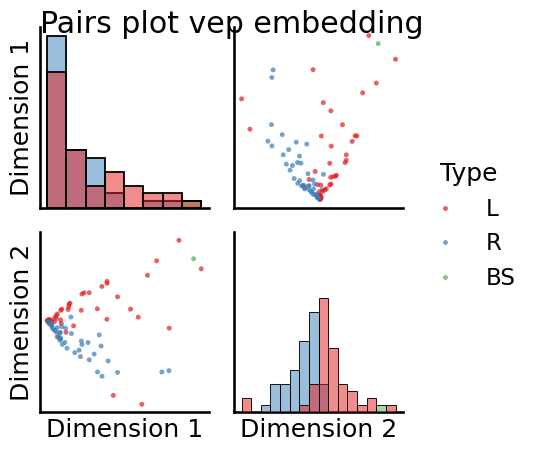

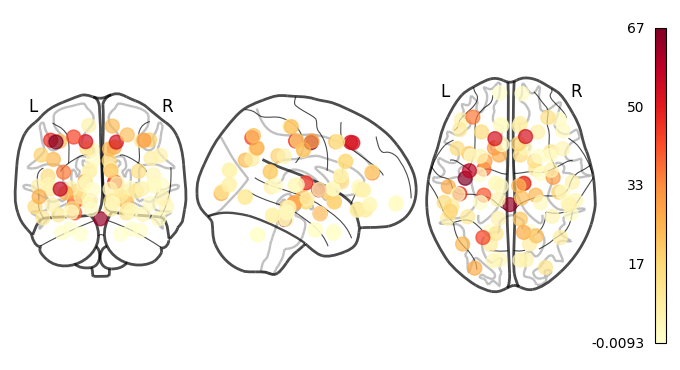

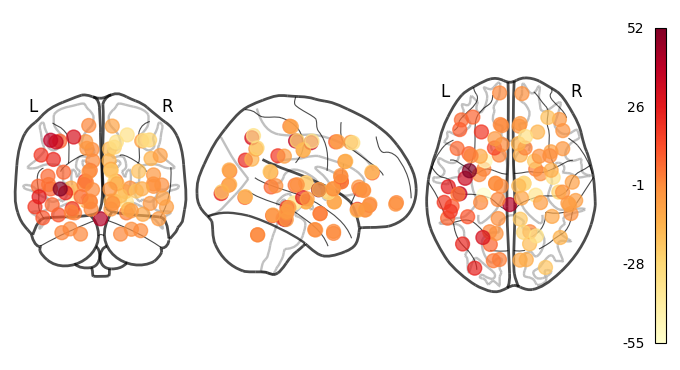

In [15]:
find_fiori_fede_embedding(matrix, 2, [0, 1], idx=None, labels=human_labs)

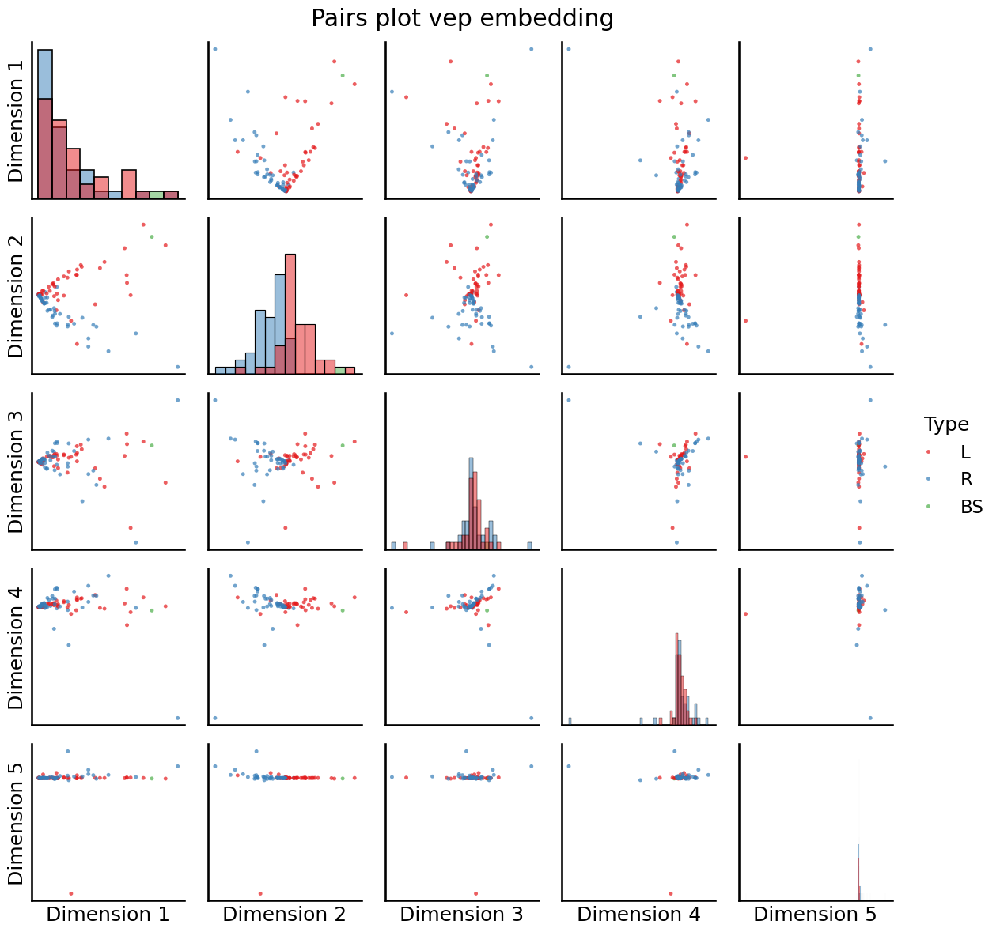

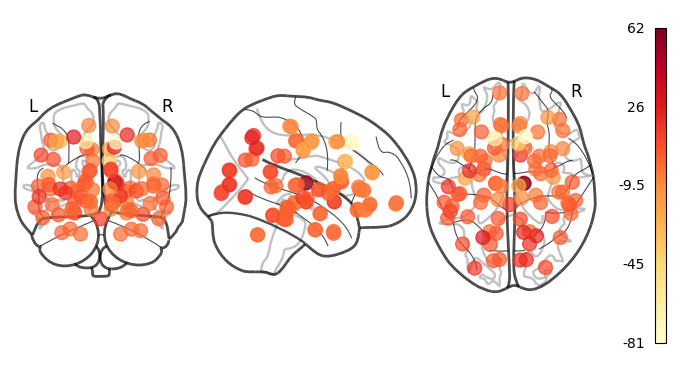

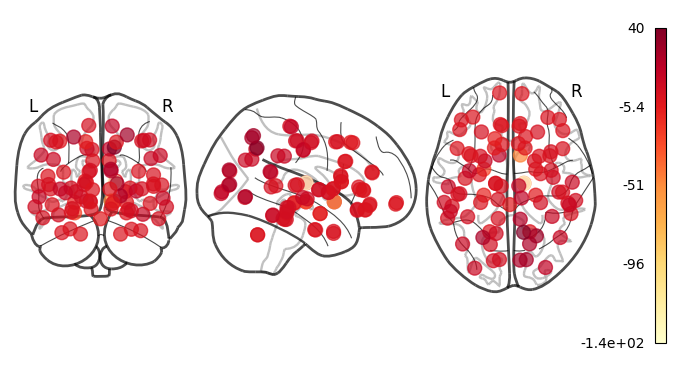

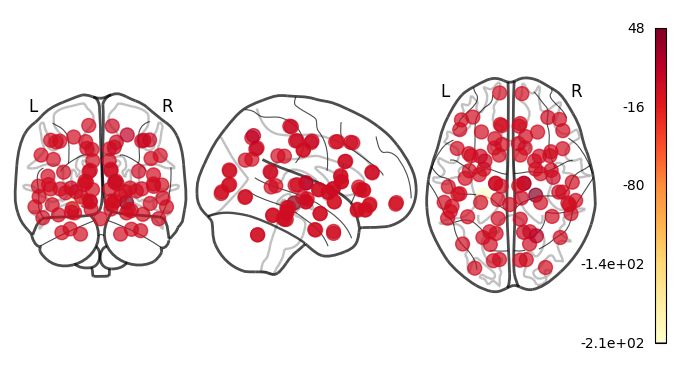

In [16]:
find_fiori_fede_embedding(matrix, 5, [2, 3, 4], idx=None, labels=human_labs)

# ASE

## Preview

In [10]:
def plot_ase_distribution(adjacencies):
    total_vaps = []
    for adjacency in adjacencies.T:
        vaps, _ = eigh(adjacency)
        total_vaps.append(vaps)
        
    mean_vaps = np.mean(np.array(total_vaps), axis=0)
    variance_vaps = np.var(np.array(total_vaps), axis=0)

    plt.figure(figsize=(8, 4))
    plt.errorbar(range(len(mean_vaps)), mean_vaps, yerr=np.sqrt(variance_vaps), fmt='o', markersize=5,
                 ecolor='red', capsize=5, marker='o', linestyle='-', label='Mean Eigenvalue with Variance')

    plt.title('Mean Eigenvalue Spectrum of all the Laplacians')
    plt.xlabel('Index of Eigenvalue')
    plt.ylabel('Eigenvalue')
    plt.grid(True)
    plt.legend()
    plt.show()
    
def plot_ase_n_random_matrices(adjacencies, n_adj):
    total_vaps = []
    for _ in range(n_adj):
        idx = random.randint(0, 1065)
        adjacency_matrix = adjacencies[:, :, idx]
        vaps, _ = eigh(adjacency_matrix)
        total_vaps.append(vaps)

    plt.figure(figsize=(8, 4))
    for i, vaps in enumerate(total_vaps):
        plt.plot(vaps, marker='o', label=f'Matrix {i+1}')
    
    plt.title('Eigenvalue Spectrum of Multiple Laplacians')
    plt.xlabel('Index of Eigenvalue')
    plt.ylabel('Eigenvalue')
    plt.grid(True)
    plt.legend() 
    plt.show()

/tmp/ipykernel_4200/537783394.py:11: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.errorbar(range(len(mean_vaps)), mean_vaps, yerr=np.sqrt(variance_vaps), fmt='o', markersize=5,


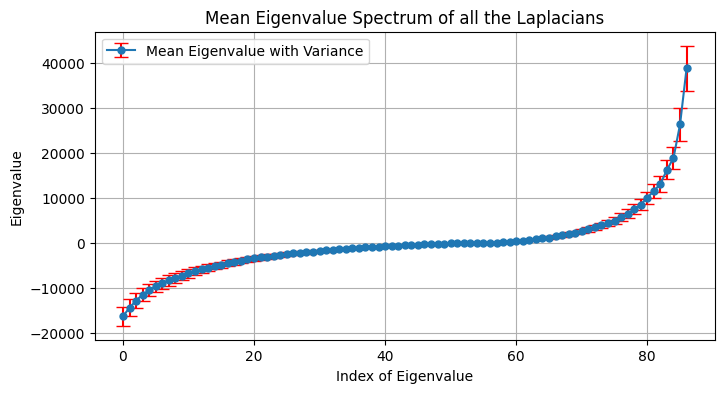

In [11]:
plot_ase_distribution(matrix)

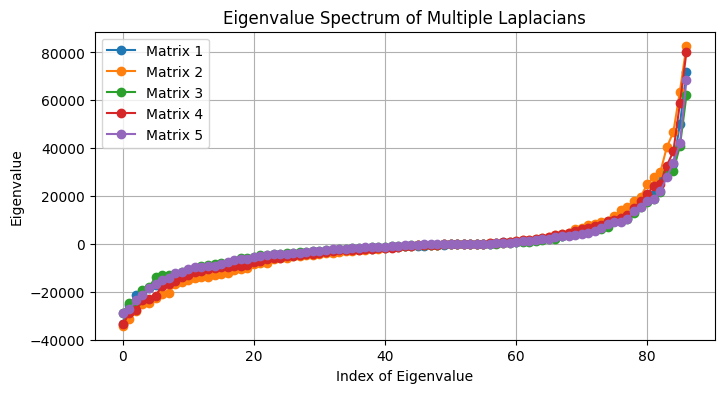

In [245]:
plot_ase_n_random_matrices(matrix, 5)

## Visualize embeddings

In [16]:
def pairplot_ase_n_dimensions(adjacencies, n_components, dimensions_to_view_on_brain):

    idx = random.randint(0, 1058)
    adjacency_matrix = adjacencies[:, :, idx].astype('float32')
    ase = ASE(n_components = n_components)
    embedding = ase.fit_transform(adjacency_matrix)

    _ = pairplot(embedding, title="Pairs plot vep embedding", labels=human_labs)
    
    for dimension in dimensions_to_view_on_brain:
        plotting.plot_markers(embedding[:, dimension], node_coords, node_size='auto', node_cmap=cm.YlOrRd)


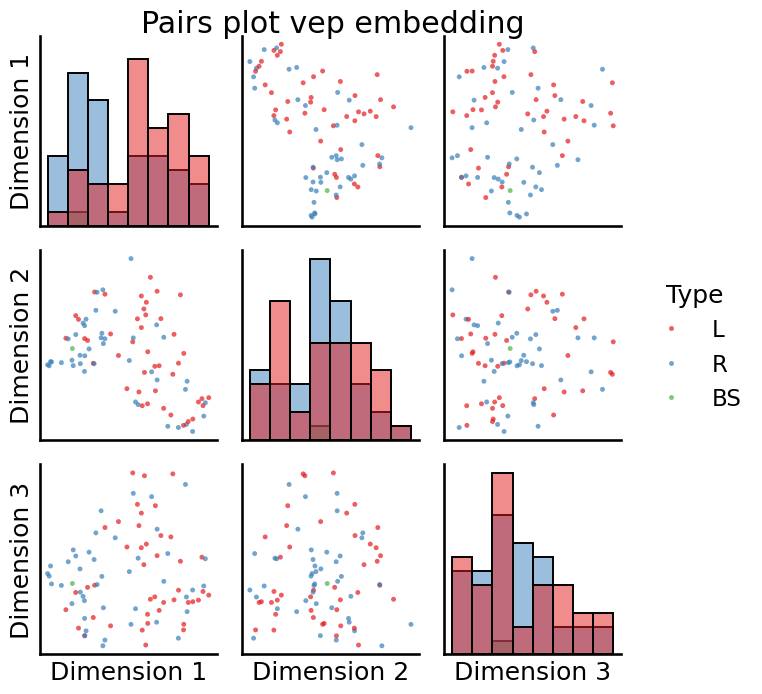

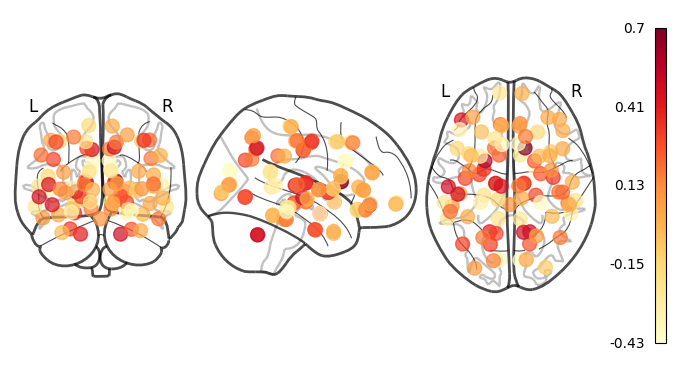

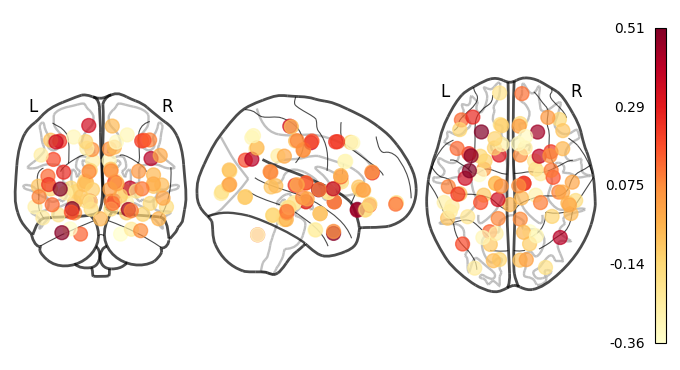

In [17]:
pairplot_ase_n_dimensions(matrix, n_components = None, dimensions_to_view_on_brain = [1, 2])

# VEPS

## Visualizacion de Veps

In [32]:
def plot_vaps_n_random_matrices(adjacencies, n_adj, normed=False):
    total_vaps = []
    for _ in range(n_adj):
        idx = random.randint(0, 1065)
        adjacency_matrix = adjacencies[:, :, idx]
        L = laplacian(adjacency_matrix, normed = normed)
        vaps, _ = eigh(L)
        total_vaps.append(vaps)

    plt.figure(figsize=(8, 4))
    for i, vaps in enumerate(total_vaps):
        plt.plot(vaps, marker='o', label=f'Matrix {i+1}')
    
    plt.gca().yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    plt.gca().ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    
    # if normed:
    #     plt.title(f'Valores propios de {n_adj} laplacianos normalizados tomados aleatoriamente')
    # else:
    #     plt.title(f'Valores propios de {n_adj} laplacianos tomados aleatoriamente')
    
    plt.xlabel('Índice del valor propio', fontsize=16)
    plt.ylabel('Valores propios', fontsize=16)
    plt.grid(True)
    plt.legend() 
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.show()


def plot_vaps_distribution(adjacencies, normed=False, matrix_type = 'SC'):
    total_vaps = []
    for adjacency in adjacencies.T:
        L = laplacian(adjacency, normed=normed)
        vaps, _ = eigh(L)
        total_vaps.append(vaps)
        
    mean_vaps = np.mean(np.array(total_vaps), axis=0)
    variance_vaps = np.var(np.array(total_vaps), axis=0)

    if normed:
        mean_vaps_indices_1 = np.where(mean_vaps > -50, 1, 0) 
        mean_vaps_indices_2 = np.where(mean_vaps < 50, 1, 0)
        mean_vap_indices_total = mean_vaps_indices_1 * mean_vaps_indices_2 # tiene los ceros de ambas condiciones
        mean_vaps_indices = np.where(mean_vap_indices_total == 1)
        mean_vaps = mean_vaps[mean_vaps_indices]
        variance_vaps = variance_vaps[mean_vaps_indices]

    plt.figure(figsize=(8, 4))
    plt.errorbar(range(len(mean_vaps)), mean_vaps, yerr=np.sqrt(variance_vaps), fmt='o', markersize=5,
                 ecolor='red', capsize=5, marker='o', linestyle='-', label='Valor medio de valor propio con su varianza')
    
    # if normed:
    #     plt.title(f'Valor medio del espectro de todos los laplacianos normalizados de la {matrix_type}')
    # else:
    #     plt.title(f'Valor medio del espectro de todos los laplacianos de la {matrix_type}')
        
    
    plt.xlabel('Índice del valor propio', fontsize=14)
    plt.ylabel('Valores propios', fontsize=14)
    plt.grid(True)
    plt.legend(fontsize=12)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.show()
    


In [33]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import ScalarFormatter

def plot_vaps_distribution(adjacencies, normed=False, matrix_type='SC'):
    total_vaps = []
    for adjacency in adjacencies.T:
        L = laplacian(adjacency, normed=normed)
        vaps, _ = eigh(L)
        total_vaps.append(vaps)
        
    mean_vaps = np.mean(np.array(total_vaps), axis=0)
    variance_vaps = np.var(np.array(total_vaps), axis=0)

    if normed:
        mean_vaps_indices_1 = np.where(mean_vaps > -50, 1, 0) 
        mean_vaps_indices_2 = np.where(mean_vaps < 50, 1, 0)
        mean_vap_indices_total = mean_vaps_indices_1 * mean_vaps_indices_2
        mean_vaps_indices = np.where(mean_vap_indices_total == 1)
        mean_vaps = mean_vaps[mean_vaps_indices]
        variance_vaps = variance_vaps[mean_vaps_indices]

    plt.figure(figsize=(8, 4))
    plt.errorbar(range(len(mean_vaps)), mean_vaps, yerr=np.sqrt(variance_vaps), fmt='o', markersize=5,
                 ecolor='red', capsize=5, marker='o', linestyle='-', label='Valor medio de valor propio con su varianza')

    plt.gca().yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    plt.ticklabel_format(axis='y', style='sci', scilimits=(2, 4))  # Set scientific notation for y-axis

    plt.xlabel('Índice del valor propio', fontsize=14)
    plt.ylabel('Valores propios', fontsize=14)
    plt.grid(True)
    plt.legend(fontsize=12)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.show()


/tmp/ipykernel_7658/75134188.py:24: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.errorbar(range(len(mean_vaps)), mean_vaps, yerr=np.sqrt(variance_vaps), fmt='o', markersize=5,


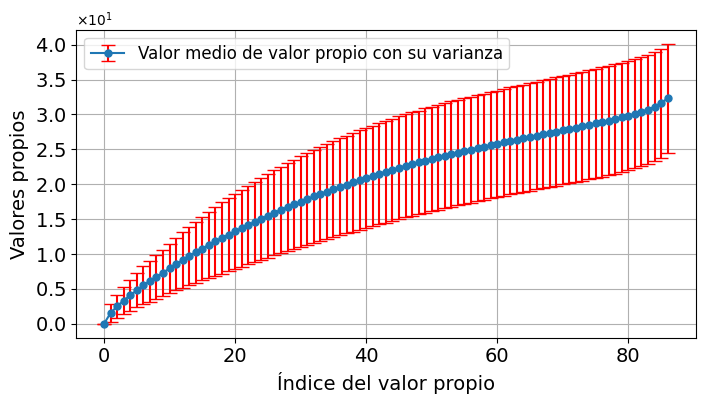

In [34]:
plot_vaps_distribution(matrix.astype('float32'), normed=False, matrix_type=SC_or_FC)

/tmp/ipykernel_7658/75134188.py:24: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.errorbar(range(len(mean_vaps)), mean_vaps, yerr=np.sqrt(variance_vaps), fmt='o', markersize=5,


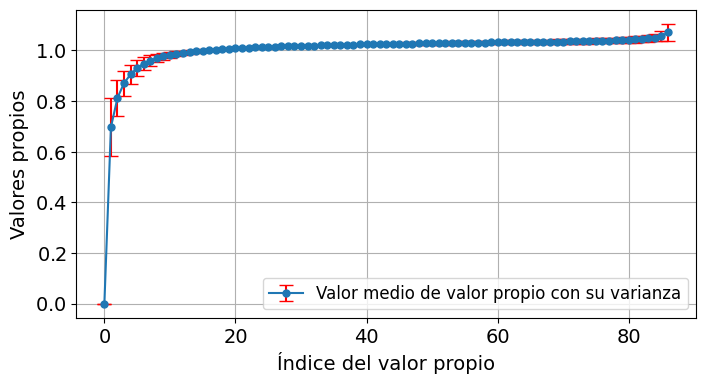

In [35]:
plot_vaps_distribution(matrix.astype('float32'), True, SC_or_FC)

## Visualizacion de embeddings

### LSE

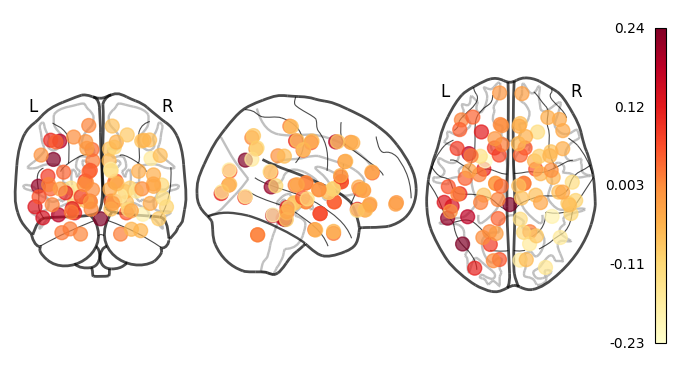

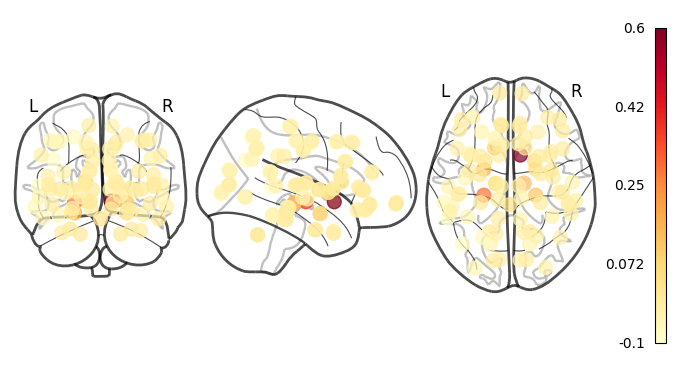

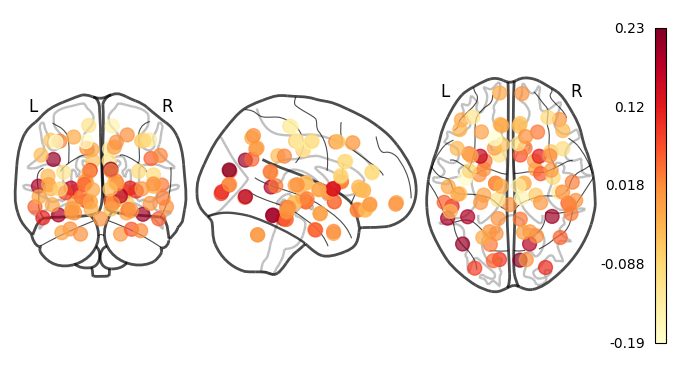

In [28]:
idx = random.randint(0, 1058)
adjacency_matrix = matrix[:, :, idx].astype('float32')

lse = LSE(n_components=5)
embedding = lse.fit_transform(adjacency_matrix)[0]

# _ = pairplot(embedding, title="Pairs plot normalized vep embedding", labels=human_labs)

plotting.plot_markers(embedding[:, 1], node_coords, node_size='auto', node_cmap=cm.YlOrRd)
plotting.plot_markers(embedding[:, 2], node_coords, node_size='auto', node_cmap=cm.YlOrRd)
plotting.plot_markers(embedding[:, 3], node_coords, node_size='auto', node_cmap=cm.YlOrRd)

### Mi version

In [62]:
def pairplot_vaps_n_dimensions(adjacencies, n_dimensions, dimensions_to_view_on_brain, normed=False, idx=None, labels = human_labs):

    if idx:
        pass
    else:
        idx = random.randint(0, 1058)
    print(idx)
    adjacency_matrix = adjacencies[:, :, idx].astype('float32')
    L = laplacian(adjacency_matrix, normed = normed)
    vaps, veps = eigh(L)
    
    print(vaps[0])
    
    veps_n_dim_rounded = veps[:, :n_dimensions]
    
    # veps_n_dim_rounded = np.round(veps_n_dim, decimals=3)
    
    # if normed:
    #     _ = pairplot(veps_n_dim, title="Pairs plot normalized vep embedding of FC", labels=labels)
    # else:
    #     _ = pairplot(veps_n_dim, title="Pairs plot vep embedding", labels=labels)
    
    for dimension in dimensions_to_view_on_brain:
        node_vmin = np.min(veps_n_dim_rounded[:, dimension]) 
        node_vmax = np.max(veps_n_dim_rounded[:, dimension]) 
        plotting.plot_markers(veps_n_dim_rounded[:, dimension], node_coords, node_size='auto', node_cmap=cm.YlOrRd, node_vmin=node_vmin, node_vmax=node_vmax)

#### Sin normalizar

403
0.0


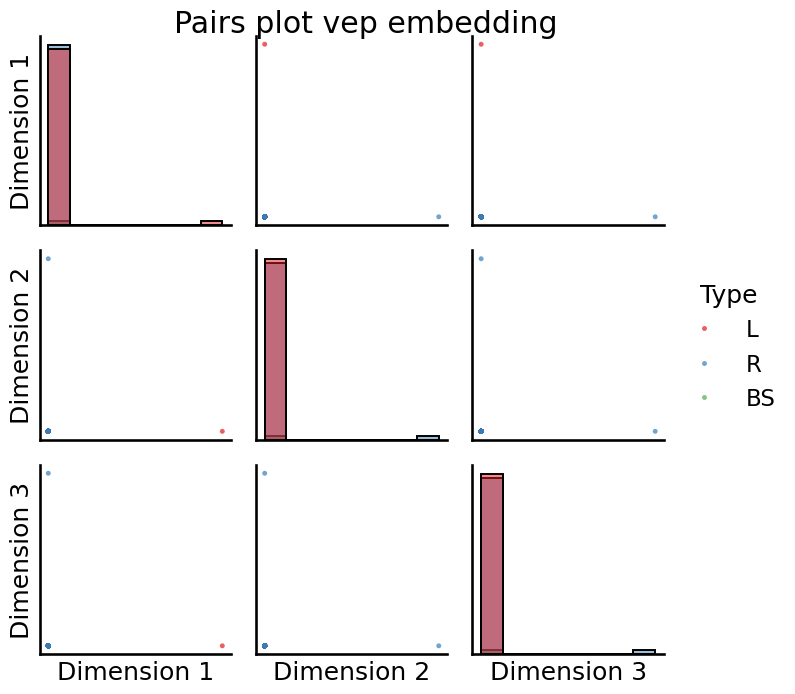

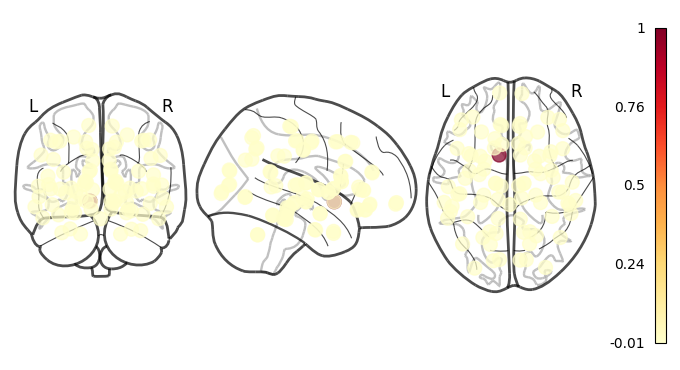

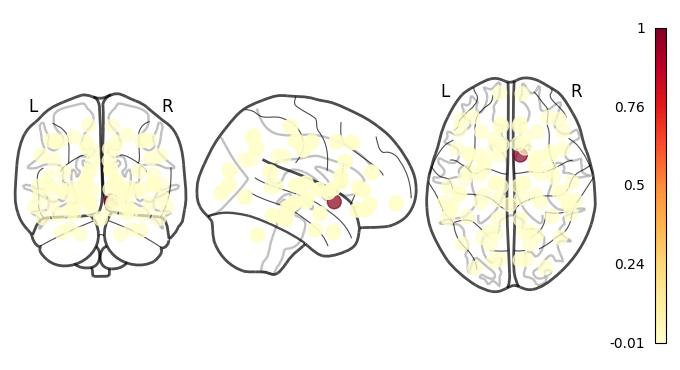

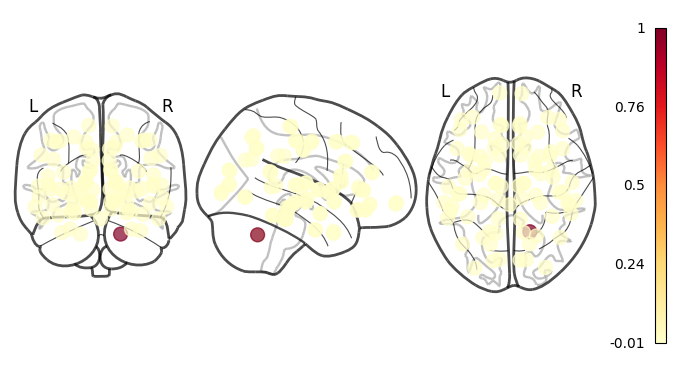

In [30]:
pairplot_vaps_n_dimensions(matrix, 3, [0, 1, 2], idx=403)

#### Normalizado

281
5.9604645e-07


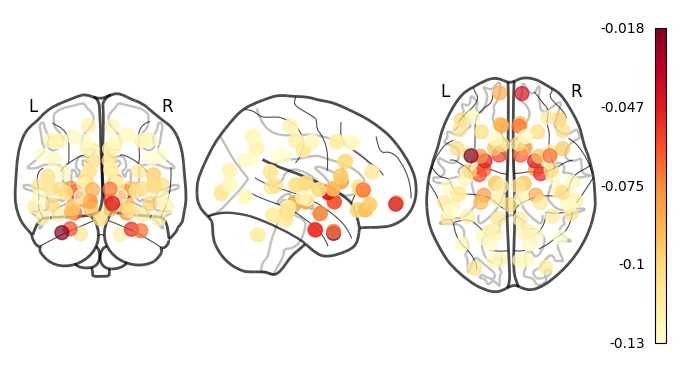

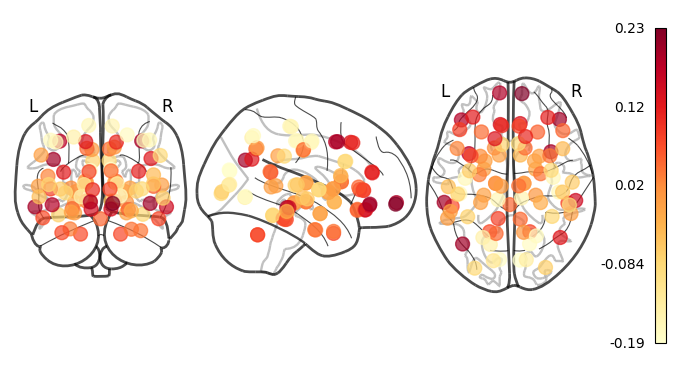

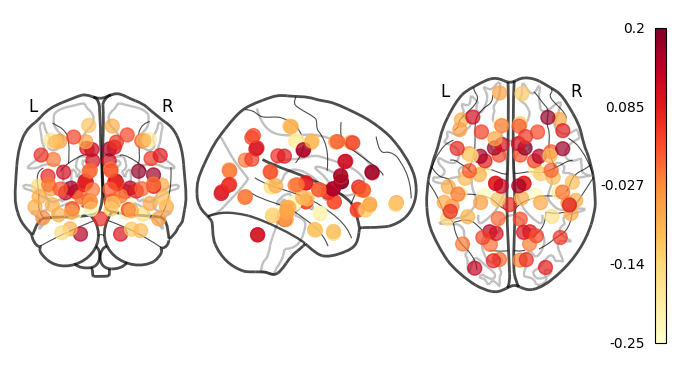

In [63]:
pairplot_vaps_n_dimensions(matrix.astype('float32'), 3, [0, 1, 2], normed = True)

# Modos de FC

In [11]:
def pairplot_vaps_n_dimensions(adjacencies, n_dimensions, dimensions_to_view_on_brain, idx=None, labels = human_labs):

    if idx:
        pass
    else:
        idx = random.randint(0, 1058)
    print(idx)
    adjacency_matrix = adjacencies[:, :, idx].astype('float32')
    # L = laplacian(adjacency_matrix, normed = normed)
    vaps, veps = eigh(adjacency_matrix)
    
    print(vaps[0])
    
    veps_n_dim = veps[:, :n_dimensions]
    
    veps_n_dim_rounded = np.round(veps_n_dim, decimals=3)
    

    # _ = pairplot(veps_n_dim, title="Pairs plot vep embedding", labels=labels)
    
    for dimension in dimensions_to_view_on_brain:
        node_vmin = np.min(veps_n_dim_rounded[:, dimension]) - 0.01
        node_vmax = np.max(veps_n_dim_rounded[:, dimension]) + 0.01
        plotting.plot_markers(veps_n_dim_rounded[:, dimension], node_coords, node_size='auto', node_cmap=cm.YlOrRd, node_vmin=node_vmin, node_vmax=node_vmax)

231
0.030145962


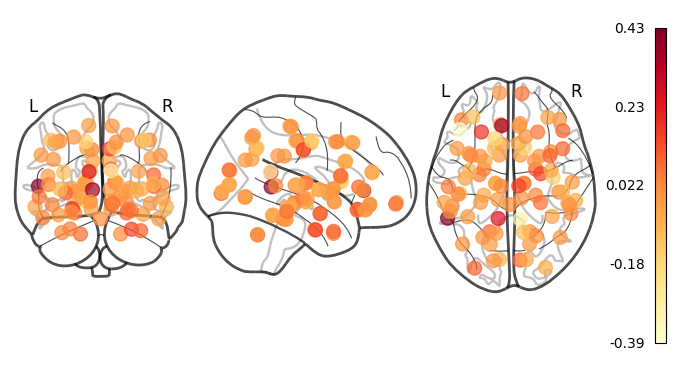

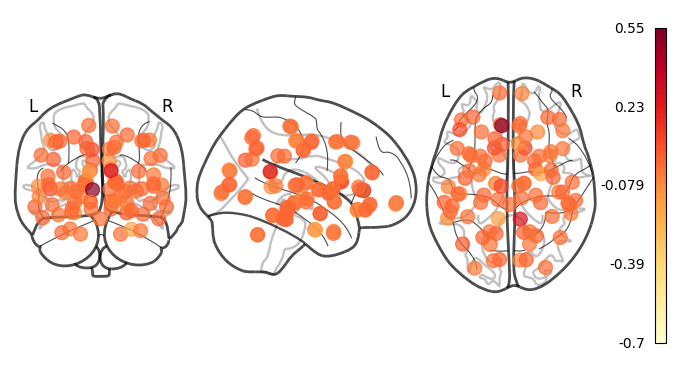

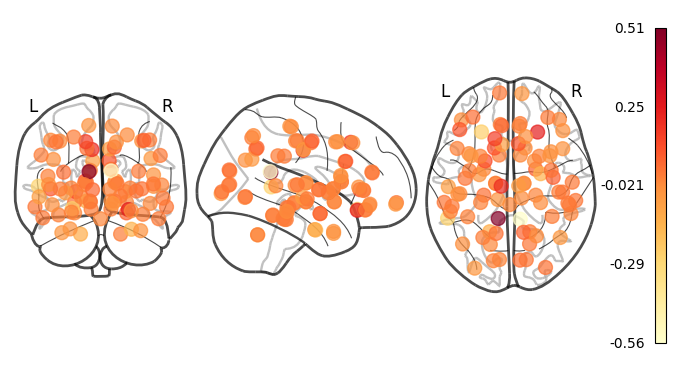

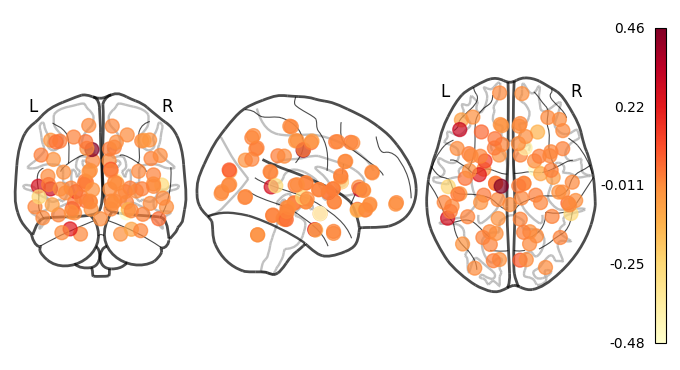

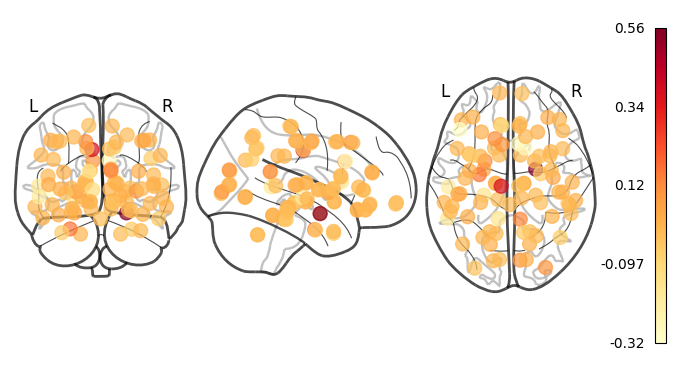

In [12]:
pairplot_vaps_n_dimensions(matrix, 5, [0, 1, 2, 3, 4], idx=None, labels = human_labs)

# Seeing coordinate

In [1]:
import numpy as np
from nilearn import datasets
from nilearn import surface

fsaverage = datasets.fetch_surf_fsaverage()

destrieux_atlas = datasets.fetch_atlas_surf_destrieux()

atlas = destrieux_atlas
coordinates = []
labels = destrieux_atlas["labels"]
for hemi in ["left", "right"]:
    vert = destrieux_atlas[f"map_{hemi}"]
    rr, _ = surface.load_surf_mesh(fsaverage[f"pial_{hemi}"])
    for k, label in enumerate(labels):
        if "Unknown" not in str(label):  # Omit the Unknown label.
            # Compute mean location of vertices in label of index k
            coordinates.append(np.mean(rr[vert == k], axis=0))

coordinates = np.array(coordinates)  # 3D coordinates of parcels


Dataset created in /home/personal/nilearn_data/destrieux_surface



 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


In [2]:
coordinates

array([[-23.377884  ,  57.25573   ,  -7.4051414 ],
       [-37.46939   , -81.96658   , -12.638724  ],
       [ -7.5394735 , -33.596226  ,  67.010735  ],
       [-56.978683  , -10.86279   ,  12.859523  ],
       [-13.822306  ,  64.52821   ,  -3.1002867 ],
       [ -6.999568  ,  39.89145   ,   6.512251  ],
       [ -7.118853  ,  14.908358  ,  36.577255  ],
       [ -7.3820505 , -11.971637  ,  41.96329   ],
       [ -2.2016687 , -39.34867   ,  29.63743   ],
       [ -6.9904394 , -46.51293   ,   4.1533055 ],
       [ -4.4030004 , -83.13529   ,  17.716713  ],
       [-50.373783  ,  11.379045  ,   7.4899697 ],
       [-45.139156  ,  29.351091  , -11.154784  ],
       [-50.15533   ,  29.98325   ,   2.893998  ],
       [-37.29927   ,  32.969536  ,  32.232876  ],
       [ -8.824235  ,  23.961061  ,  47.19286   ],
       [-40.023712  ,  -5.7718463 ,  -2.641215  ],
       [-39.12181   ,  10.727478  ,  -4.8867564 ],
       [-40.776924  , -83.84062   ,  11.7453575 ],
       [-14.009644  , -91.58402

In [9]:
import numpy as np
from nilearn import datasets
from nilearn import surface
import abagen

fsaverage = datasets.fetch_surf_fsaverage()
desikan_atlas = abagen.fetch_desikan_killiany()

atlas = desikan_atlas
coordinates = []
labels = desikan_atlas["labels"]
for hemi in ["left", "right"]:
    vert = desikan_atlas[f"map_{hemi}"]
    rr, _ = surface.load_surf_mesh(fsaverage[f"pial_{hemi}"])
    for k, label in enumerate(labels):
        if "Unknown" not in str(label):  # Omit the Unknown label.
            # Compute mean location of vertices in label of index k
            coordinates.append(np.mean(rr[vert == k], axis=0))

coordinates = np.array(coordinates)  # 3D coordinates of parcels

KeyError: 'labels'

In [10]:
desikan_atlas

{'image': '/home/personal/anaconda3/envs/NG/lib/python3.9/site-packages/abagen/data/atlas-desikankilliany.nii.gz',
 'info': '/home/personal/anaconda3/envs/NG/lib/python3.9/site-packages/abagen/data/atlas-desikankilliany.csv'}

In [8]:
labels

[b'Unknown',
 b'G_and_S_frontomargin',
 b'G_and_S_occipital_inf',
 b'G_and_S_paracentral',
 b'G_and_S_subcentral',
 b'G_and_S_transv_frontopol',
 b'G_and_S_cingul-Ant',
 b'G_and_S_cingul-Mid-Ant',
 b'G_and_S_cingul-Mid-Post',
 b'G_cingul-Post-dorsal',
 b'G_cingul-Post-ventral',
 b'G_cuneus',
 b'G_front_inf-Opercular',
 b'G_front_inf-Orbital',
 b'G_front_inf-Triangul',
 b'G_front_middle',
 b'G_front_sup',
 b'G_Ins_lg_and_S_cent_ins',
 b'G_insular_short',
 b'G_occipital_middle',
 b'G_occipital_sup',
 b'G_oc-temp_lat-fusifor',
 b'G_oc-temp_med-Lingual',
 b'G_oc-temp_med-Parahip',
 b'G_orbital',
 b'G_pariet_inf-Angular',
 b'G_pariet_inf-Supramar',
 b'G_parietal_sup',
 b'G_postcentral',
 b'G_precentral',
 b'G_precuneus',
 b'G_rectus',
 b'G_subcallosal',
 b'G_temp_sup-G_T_transv',
 b'G_temp_sup-Lateral',
 b'G_temp_sup-Plan_polar',
 b'G_temp_sup-Plan_tempo',
 b'G_temporal_inf',
 b'G_temporal_middle',
 b'Lat_Fis-ant-Horizont',
 b'Lat_Fis-ant-Vertical',
 b'Lat_Fis-post',
 b'Medial_wall',
 b'Pol

In [7]:
coordinates

array([[-23.377884  ,  57.25573   ,  -7.4051414 ],
       [-37.46939   , -81.96658   , -12.638724  ],
       [ -7.5394735 , -33.596226  ,  67.010735  ],
       [-56.978683  , -10.86279   ,  12.859523  ],
       [-13.822306  ,  64.52821   ,  -3.1002867 ],
       [ -6.999568  ,  39.89145   ,   6.512251  ],
       [ -7.118853  ,  14.908358  ,  36.577255  ],
       [ -7.3820505 , -11.971637  ,  41.96329   ],
       [ -2.2016687 , -39.34867   ,  29.63743   ],
       [ -6.9904394 , -46.51293   ,   4.1533055 ],
       [ -4.4030004 , -83.13529   ,  17.716713  ],
       [-50.373783  ,  11.379045  ,   7.4899697 ],
       [-45.139156  ,  29.351091  , -11.154784  ],
       [-50.15533   ,  29.98325   ,   2.893998  ],
       [-37.29927   ,  32.969536  ,  32.232876  ],
       [ -8.824235  ,  23.961061  ,  47.19286   ],
       [-40.023712  ,  -5.7718463 ,  -2.641215  ],
       [-39.12181   ,  10.727478  ,  -4.8867564 ],
       [-40.776924  , -83.84062   ,  11.7453575 ],
       [-14.009644  , -91.58402